In [1]:
import pandas as pd
import numpy as np
import scipy as s
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin_min
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import DBSCAN
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster

### Loading data

In [2]:
sen_int = pd.read_csv('storage/sen_int_dis.csv')
sensor = pd.read_csv('storage/sensor.csv')

In [3]:
sen_float = pd.read_csv('storage/sen_float_dis.csv')

In [4]:
sen_int['date'] = sen_int['date'].apply(pd.to_datetime)

In [5]:
start = sen_int['date'].min()
print(f'Start: {start}')
week_range = pd.date_range(start, start-np.timedelta64(1, 's') + np.timedelta64(1, 'W'))
fw_end = week_range[-1] + np.timedelta64(1, 'D') - np.timedelta64(1, 's')
print(f'First week end {fw_end}')
weekdays = week_range.strftime("%a").tolist()
weekdays

Start: 2020-02-26 00:00:00.087705
First week end 2020-03-03 23:59:59.087705


['Wed', 'Thu', 'Fri', 'Sat', 'Sun', 'Mon', 'Tue']

In [6]:
dateS = pd.to_datetime(sen_int.timestamp[0])
dateF = pd.to_datetime(sen_int.timestamp[len(sen_int)-1])
print(f"Starting from date {dateS}, ending date {dateF}")
print(f"Starting from week {dateS.week}, ending it week {dateF.week}")
print(f"Starting from weekday {dateS.strftime('%a')}, ending it weekday {dateF.strftime('%a')}")

Starting from date 2020-02-26 00:00:00.087705, ending date 2020-08-26 10:28:17.291658
Starting from week 9, ending it week 35
Starting from weekday Wed, ending it weekday Wed


In [7]:
sensor

,sensor_id,node_id,type,name,room
0,5894,541150,INT,corridor/ambience/motion,corridor
1,5895,541151,INT,bathroom/ambience/motion,bathroom
2,7125,542381,INT,bathroom/ambience/light,bathroom
3,5896,541152,INT,bedroom/bed/pressure,bedroom
4,6127,541383,INT,livingroom/tv/light,livingroom
5,6220,541444,INT,balcon/door/contact,balcon
6,6253,541509,INT,kitchen/fridge/contact,kitchen
7,6632,541888,FLOAT,kitchen/coffeemaker/current,kitchen
8,6633,541889,FLOAT,kitchen/sandwichmaker/current,kitchen
9,6634,541890,FLOAT,kitchen/dishwasher/current,kitchen


In [8]:
id_room = dict()
for i, x in sensor.iterrows():
    id_room[x.sensor_id] = x.room + "-" + x['name'].split('/')[1]
sen_room = dict()
rooms = sensor['room'].unique().tolist()
for i, x in sensor.iterrows():
    sen_room[x.sensor_id] = [x.room, rooms.index(x.room)]

In [9]:
io_home = {0.0: 'Not in home', 1.0: 'In home'}

In [10]:
def time_to_polarW(t):
    """
    Convert time to polar coordinates, where 2*pi is a week
    return (radius, angle [rad])
    """
    tt_rad = 2*np.pi/(fw_end - start).value
    x = (t - start).value*tt_rad
    return x//np.pi//2+1, x%(2*np.pi)

In [11]:
dfsen = sen_int[sen_int['value'] != 0]

In [12]:
sensor

,sensor_id,node_id,type,name,room
0,5894,541150,INT,corridor/ambience/motion,corridor
1,5895,541151,INT,bathroom/ambience/motion,bathroom
2,7125,542381,INT,bathroom/ambience/light,bathroom
3,5896,541152,INT,bedroom/bed/pressure,bedroom
4,6127,541383,INT,livingroom/tv/light,livingroom
5,6220,541444,INT,balcon/door/contact,balcon
6,6253,541509,INT,kitchen/fridge/contact,kitchen
7,6632,541888,FLOAT,kitchen/coffeemaker/current,kitchen
8,6633,541889,FLOAT,kitchen/sandwichmaker/current,kitchen
9,6634,541890,FLOAT,kitchen/dishwasher/current,kitchen


### Visualization: Polar Plot

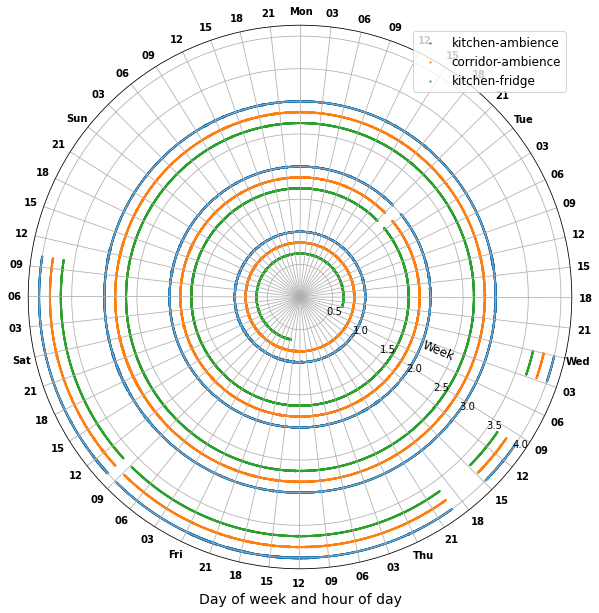

In [315]:
def plot_polar(ddff, typ = 'line', figsize = (10, 10), rdim = 1, rdim_fe = dict(), init_r = 0, clas = 'sensor_id'):
    """
    0 rad = Wednesday
    2*np.pi = 1 week
    """
    def build_scatter(x, y, v, typ, label = 'x'):
        x, y, v = np.array(x), np.array(y)*rdim, np.array(v)
        try:
            i = float(typ)
            c = ax.scatter(x, y, s=v*i, cmap='hsv', alpha=0.75, label = label)
        except:
            if typ == 'log': c = ax.scatter(x, y, s=np.log(v+.1), cmap='hsv', alpha=0.75, label = label)
            elif typ == 'exp': c = ax.scatter(x, y, s=np.exp(v), cmap='hsv', alpha=0.75, label = label)
            else: c = ax.scatter(x, y, s=v, cmap='hsv', alpha=0.75, label = label)

    if clas == 'sensor_id': leg = {x: id_room[x] for x in ddff.sensor_id.unique()}
    elif clas == 'in_home': leg = {x: io_home[x] for x in ddff[clas].unique()}
    else: leg = {x: x for x in ddff[clas].unique()}
    if 0 in figsize: fig = plt.figure()
    else: fig = plt.figure(figsize=figsize)
    ax = fig.gca(projection="polar")
    ll = ddff[clas].unique().tolist()
    m = 1
    rr = 0
    for x in ll:
        if len(rdim_fe) != 0 and ll.index(x) in rdim_fe.keys(): m = rdim_fe[ll.index(x)]
        ddfff = ddff[ddff[clas] == x]
        build_scatter(ddfff.angle.tolist(), ddfff.radius-rr/2/len(ll), ddfff.value*m, typ, label = leg[x])
        m = 1
        rr += 1
    ax.set_rorigin(init_r)
    ax.set_theta_zero_location("N", offset = -103)
    ax.set_theta_direction(-1)
    ax.set_xticks(np.linspace(0, 2*np.pi, 7, endpoint=False))
    ax.set_xticklabels(weekdays)
    ax.set_xticks(np.linspace(0, 2*np.pi, 56, endpoint=False))
    hh = pd.date_range(start,start+np.timedelta64(1, 'W') ,freq = '3h' ).strftime("%H").tolist()[:-1]
    for i in range(0, len(hh), 8): hh[i] =  weekdays[int(i//8)]
    ax.set_xticklabels(hh, fontweight ="bold")
    ax.legend(fontsize = 12, loc = 0)
    ax.set_xlabel('Day of week and hour of day', fontsize = 14)
    rlabel_position=ax.get_rlabel_position()
    ax.text(np.radians(rlabel_position-8),ax.get_rmax()/2.,'Week',
            rotation=-rlabel_position, fontsize = 12)
df = sen_int[sen_int.sensor_id.isin([5894, 7125, 6253, 5893])][:100000]
plot_polar(df, typ = 'exp')

AttributeError: 'PolarAxesSubplot' object has no attribute 'get_rlabel'

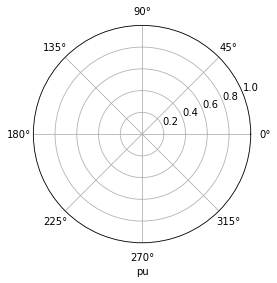

In [321]:
fig = plt.figure()
ax = fig.gca(projection="polar")
ax.set_xlabel('pu')
label_position=ax.get_rlabel_position()
print(ax.get_rlabel())

In [318]:
print(ax.get_r)

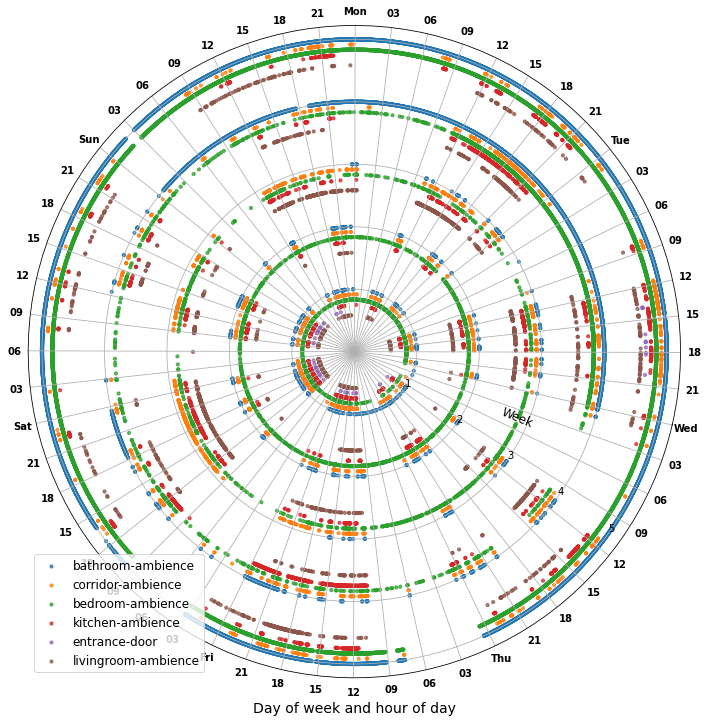

In [322]:
df = sen_int[sen_int.sensor_id.isin([5894, 5895, 5888, 5891, 5892, 5893])]
df = df[df.value != 0][:39000]
plot_polar(df, figsize = (12,12), typ = 10)

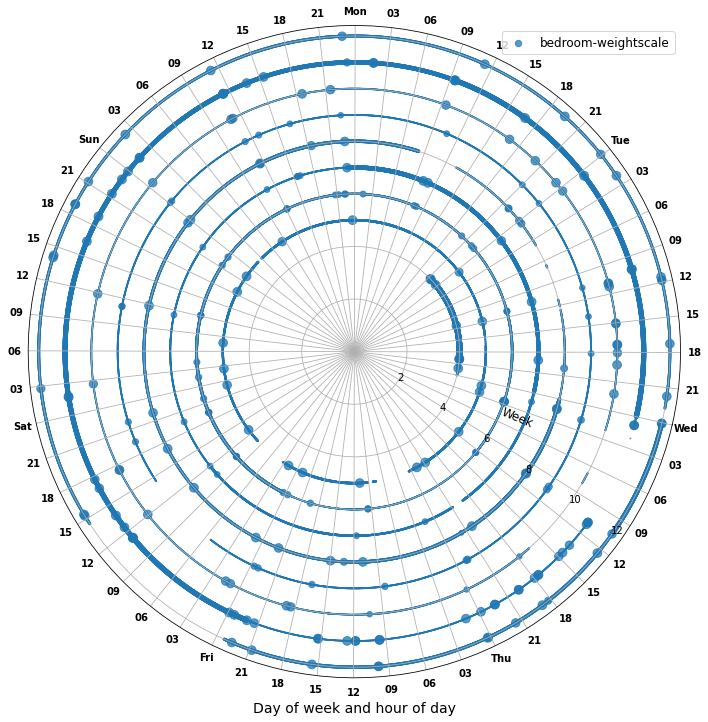

In [331]:
df = sen_int[sen_int.sensor_id.isin([6687])]
df = df[df.value != 0][:59300]
plot_polar(df, figsize = (12,12), typ = 0.3)

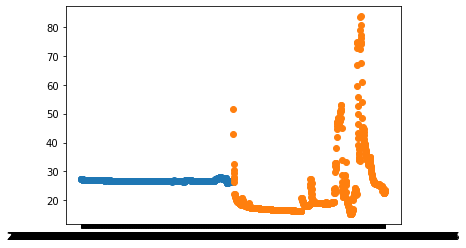

In [16]:
df0 = sen_float[sen_float.sensor_id.isin([6223])][:1000]
df1 = sen_float[sen_float.sensor_id.isin([6222])][:1000]
plt.scatter(df0.date, df0.value)
plt.scatter(df1.date, df1.value)

In [1320]:
df1

,value_id,sensor_id,timestamp,value,date,angle,radius,total_angle
0,315318,6222,2020-02-26 11:22:36.417725,51.52,2020-02-26 11:22:36.417725,0.425490,1.0,2.978433
3,315460,6222,2020-02-26 19:38:28.199166,43.02,2020-02-26 19:38:28.199166,0.734578,1.0,5.142047
5,315598,6222,2020-02-26 19:40:28.132801,32.71,2020-02-26 19:40:28.132801,0.735824,1.0,5.150769
7,315731,6222,2020-02-26 19:42:06.204089,30.64,2020-02-26 19:42:06.204089,0.736843,1.0,5.157901
10,315863,6222,2020-02-26 19:43:50.007067,29.35,2020-02-26 19:43:50.007067,0.737921,1.0,5.165450
...,...,...,...,...,...,...,...,...
1005532,63895981,6222,2020-08-25 23:08:05.538335,40.26,2020-08-25 23:08:05.538335,6.251099,26.0,1143.315120
1005545,63896786,6222,2020-08-25 23:10:39.378615,40.34,2020-08-25 23:10:39.378615,6.252697,26.0,1143.326307
1005560,63897639,6222,2020-08-25 23:13:15.457007,40.32,2020-08-25 23:13:15.457007,6.254318,26.0,1143.337658
1005573,63898374,6222,2020-08-25 23:15:26.396689,44.36,2020-08-25 23:15:26.396689,6.255679,26.0,1143.347180


In [1281]:
sensor

,sensor_id,node_id,type,name,room
0,5894,541150,INT,corridor/ambience/motion,corridor
1,5895,541151,INT,bathroom/ambience/motion,bathroom
2,7125,542381,INT,bathroom/ambience/light,bathroom
3,5896,541152,INT,bedroom/bed/pressure,bedroom
4,6127,541383,INT,livingroom/tv/light,livingroom
5,6220,541444,INT,balcon/door/contact,balcon
6,6253,541509,INT,kitchen/fridge/contact,kitchen
7,6632,541888,FLOAT,kitchen/coffeemaker/current,kitchen
8,6633,541889,FLOAT,kitchen/sandwichmaker/current,kitchen
9,6634,541890,FLOAT,kitchen/dishwasher/current,kitchen


Starting point Thu 27-Feb-2020 01:03


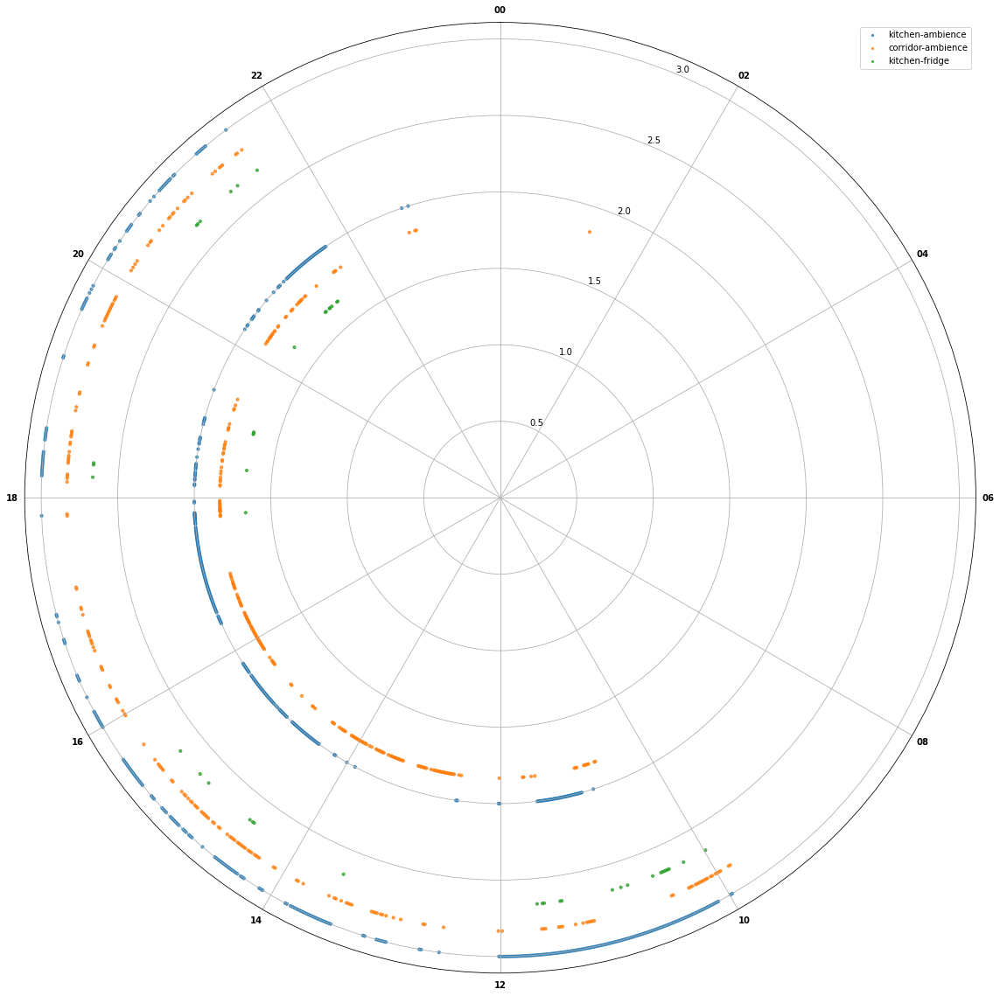

In [150]:
def plot_polar_day(ddff, typ = 'line', figsize = (20, 20), rdim = 1, rdim_fe = dict(), init_r = 0, clas = 'sensor_id'):
    """
    0 rad = Wednesday, 00:00:0
    2*np.pi = 1 week
    """
    def build_scatter(x, y, v, typ, label = 'x'):
        x, y, v = np.array(x), np.array(y)*rdim, np.array(v)
        try:
            i = float(typ)
            c = ax.scatter(x, y, s=v*i, cmap='hsv', alpha=0.75, label = label)
        except:
            if typ == 'log': c = ax.scatter(x, y, s=np.log(v+.1), cmap='hsv', alpha=0.75, label = label)
            elif typ == 'exp': c = ax.scatter(x, y, s=np.exp(v), cmap='hsv', alpha=0.75, label = label)
            else: c = ax.scatter(x, y, s=v, cmap='hsv', alpha=0.75, label = label)

    if clas == 'sensor_id': leg = {x: id_room[x] for x in ddff.sensor_id.unique()}
    else: leg = {x: x for x in ddff[clas].unique()}
    fig = plt.figure(figsize=figsize)
    ax = fig.gca(projection="polar")
    ll = ddff[clas].unique().tolist()
    m = 1
    rr = 0
    for x in ll:
        if len(rdim_fe) != 0 and ll.index(x) in rdim_fe.keys(): m = rdim_fe[ll.index(x)]
        ddfff = ddff[ddff[clas] == x]
        build_scatter(ddfff.d_angle.tolist(), ddfff.d_radius-rr/2/len(ll), ddfff.value*m, typ, label = leg[x])
        m = 1
        rr += 1
    ax.set_rorigin(init_r)
    ax.set_theta_zero_location("N")
    ax.set_theta_direction(-1)
    ax.set_xticks(np.linspace(0, 2*np.pi, 12, endpoint=False))
    hh = pd.date_range(start,start+np.timedelta64(1, 'D') ,freq = '2h' ).strftime("%H").tolist()[:-1]
    ax.set_xticklabels(hh, fontweight ="bold")
    ax.legend()
    print(f"Starting point {ddff.iloc[0].date.strftime('%a %d-%b-%Y %H:%M')}")
df = sen_int[sen_int.sensor_id.isin([5894, 7125, 6253, 5893])][3000:10000]
plot_polar_day(df, typ = 10)

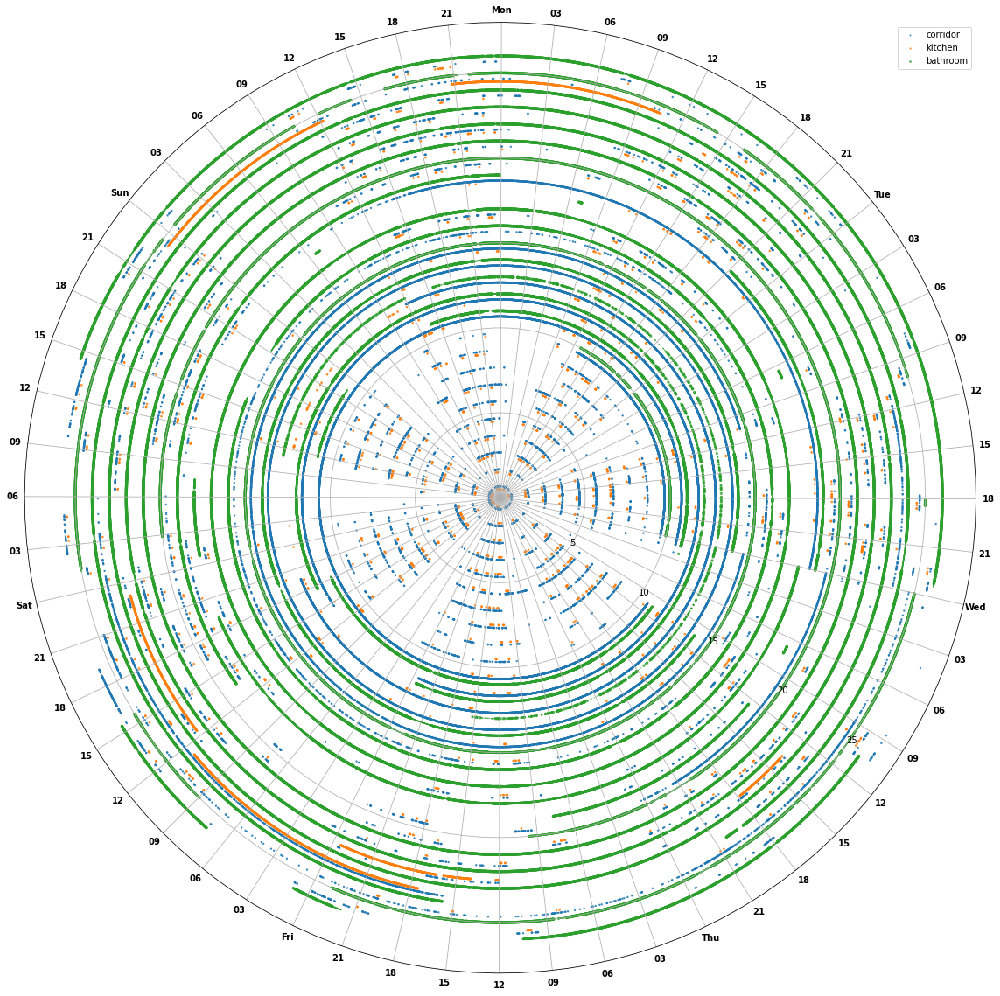

In [1280]:
plot_polar(sen_int[sen_int['sensor_id'].isin([5894, 7125, 6253])],rdim_fe = {0: 2, 2:.005}, figsize = (20,20))

In [215]:
def del_non_linear(X, bp = 50, s = 5):
    W = [i for i in range(0, len(X), bp) if np.std(X[i:i+bp,1]) > s]
    Y = np.zeros((len(W)*bp,2))
    for i in W:
        j = W.index(i)*bp
        try: Y[j:j+bp,:] = X[i:i+bp,:]
        except: next
    return Y

In [175]:
sensor

,sensor_id,node_id,type,name,room
0,5894,541150,INT,corridor/ambience/motion,corridor
1,5895,541151,INT,bathroom/ambience/motion,bathroom
2,7125,542381,INT,bathroom/ambience/light,bathroom
3,5896,541152,INT,bedroom/bed/pressure,bedroom
4,6127,541383,INT,livingroom/tv/light,livingroom
5,6220,541444,INT,balcon/door/contact,balcon
6,6253,541509,INT,kitchen/fridge/contact,kitchen
7,6632,541888,FLOAT,kitchen/coffeemaker/current,kitchen
8,6633,541889,FLOAT,kitchen/sandwichmaker/current,kitchen
9,6634,541890,FLOAT,kitchen/dishwasher/current,kitchen


### Supervised: Classification

In [336]:
df_corridor = dfsen[dfsen.sensor_id == 5894]
df_entrance = dfsen[dfsen.sensor_id == 5888]
df_home = dfsen[dfsen.sensor_id.isin([5894, 5891, 5893, 5892])]

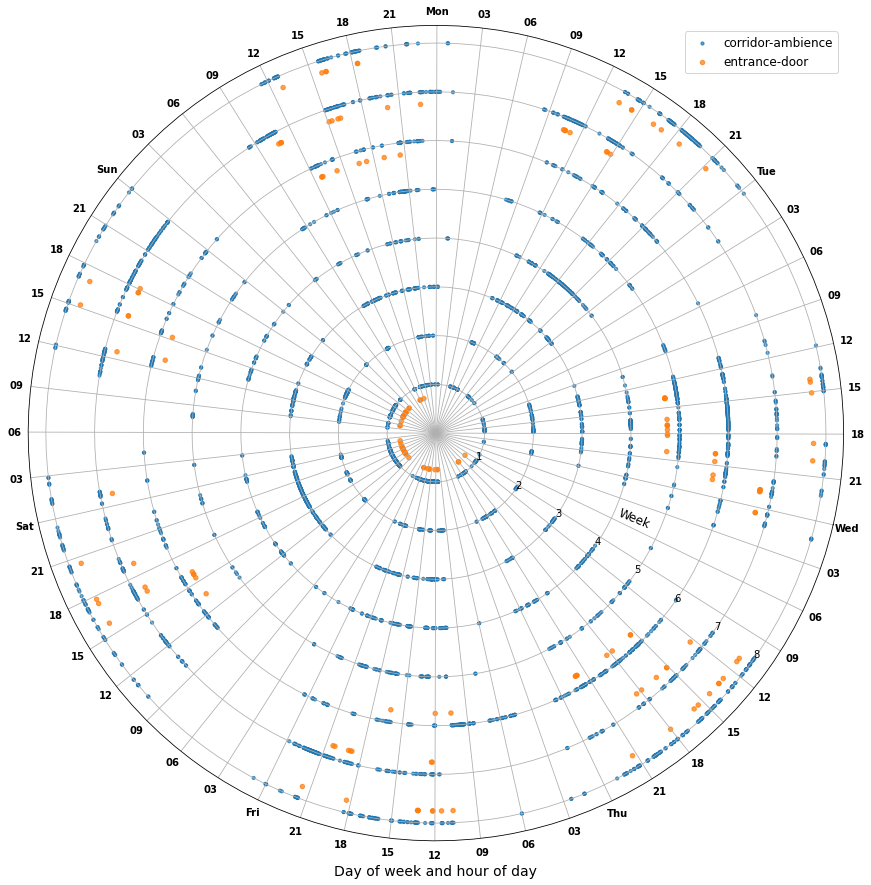

In [332]:
df_vis = dfsen[dfsen.sensor_id.isin([5894, 5888])][:5600]
plot_polar(df_vis, figsize = (15,15), typ = 10, rdim_fe = {1:2})

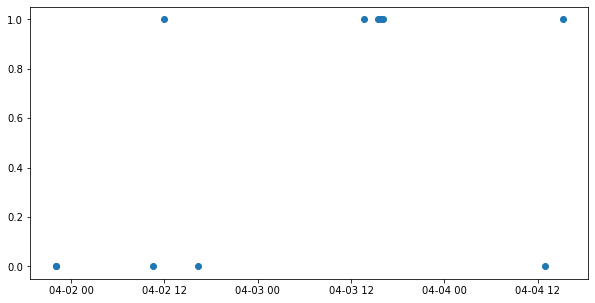

In [184]:
figure = plt.figure(figsize = (10, 5))
ddf = df_door.iloc[66:78]
plt.scatter(ddf.date, ddf.in_home)

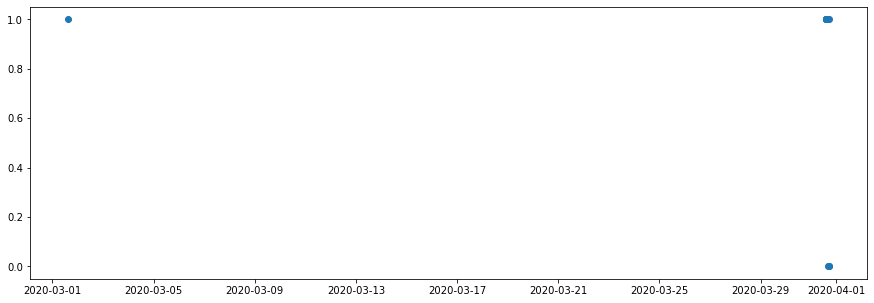

In [205]:
ini = 46
nnn = 10
figure = plt.figure(figsize = (15,5))
plt.scatter(df_door.date[ini:ini+nnn], df_door.in_home[ini:ini+nnn])

2020-03-02 10:21:11.473191


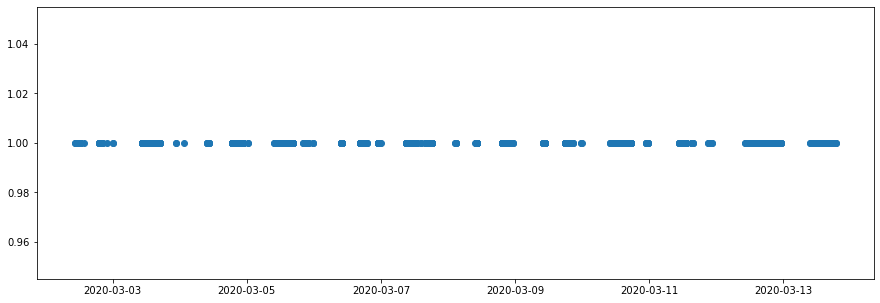

In [224]:
ini = 2040
nnn = 2000
figure = plt.figure(figsize = (15,5))
print(df_home.date.iloc[ini])
plt.scatter(df_home.date[ini:ini+nnn], df_home.value[ini:ini+nnn])

In [179]:
dt = 20
row = df_door.iloc[64]
d = row.date
print(d, row['in_home'])
tdf = df_corridor[(df_corridor.date <= d + np.timedelta64(dt, 'm')) & (df_corridor.date >= d + np.timedelta64(-dt, 'm'))]
tdf

2020-04-01 21:50:14.421756 1.0


,value_id,sensor_id,timestamp,value,date,angle,radius,color,d_angle,d_radius,total_angle
569955,101193509,5894,2020-04-01 21:32:52.973307,1,2020-04-01 21:32:52.973307,0.805947,6.0,0,5.641632,36.0,225.553118
569969,101194320,5894,2020-04-01 21:33:53.020542,1,2020-04-01 21:33:53.020542,0.806571,6.0,0,5.645999,36.0,225.557485
569983,101195130,5894,2020-04-01 21:34:53.087229,1,2020-04-01 21:34:53.087229,0.807195,6.0,0,5.650367,36.0,225.561853
569995,101195933,5894,2020-04-01 21:35:53.136859,1,2020-04-01 21:35:53.136859,0.807819,6.0,0,5.654734,36.0,225.566220
570009,101196726,5894,2020-04-01 21:36:53.209933,1,2020-04-01 21:36:53.209933,0.808443,6.0,0,5.659103,36.0,225.570589
570022,101197515,5894,2020-04-01 21:37:53.253720,1,2020-04-01 21:37:53.253720,0.809067,6.0,0,5.663469,36.0,225.574955
570035,101198312,5894,2020-04-01 21:38:53.317340,1,2020-04-01 21:38:53.317340,0.809691,6.0,0,5.667837,36.0,225.579323
570049,101199128,5894,2020-04-01 21:39:53.373074,1,2020-04-01 21:39:53.373074,0.810315,6.0,0,5.672205,36.0,225.583691
570063,101199934,5894,2020-04-01 21:40:53.431371,1,2020-04-01 21:40:53.431371,0.810939,6.0,0,5.676572,36.0,225.588058
570075,101200731,5894,2020-04-01 21:41:53.492792,1,2020-04-01 21:41:53.492792,0.811563,6.0,0,5.680940,36.0,225.592426


In [35]:
df_corridor.iloc[10:20]

,value_id,sensor_id,timestamp,value,date,angle,radius,color,d_angle,d_radius,total_angle
5954,19414833,5894,2020-02-26 10:16:36.868383,1,2020-02-26 10:16:36.868383,0.384355,1.0,0,2.690486,1.0,2.690486
5963,19415944,5894,2020-02-26 10:17:36.928534,1,2020-02-26 10:17:36.928534,0.384979,1.0,0,2.694854,1.0,2.694854
6108,19432615,5894,2020-02-26 10:32:37.808559,1,2020-02-26 10:32:37.808559,0.394338,1.0,0,2.760368,1.0,2.760368
6526,19480586,5894,2020-02-26 11:15:40.433395,1,2020-02-26 11:15:40.433395,0.421169,1.0,0,2.948182,1.0,2.948182
6536,19481694,5894,2020-02-26 11:16:40.378162,1,2020-02-26 11:16:40.378162,0.421792,1.0,0,2.952541,1.0,2.952541
6546,19483360,5894,2020-02-26 11:18:51.521684,1,2020-02-26 11:18:51.521684,0.423154,1.0,0,2.962078,1.0,2.962078
6557,19484481,5894,2020-02-26 11:19:51.623351,1,2020-02-26 11:19:51.623351,0.423778,1.0,0,2.966449,1.0,2.966449
6567,19485600,5894,2020-02-26 11:20:51.626664,1,2020-02-26 11:20:51.626664,0.424402,1.0,0,2.970813,1.0,2.970813
6578,19486724,5894,2020-02-26 11:21:51.682994,1,2020-02-26 11:21:51.682994,0.425026,1.0,0,2.975180,1.0,2.975180
8247,19660524,5894,2020-02-26 13:58:24.847835,1,2020-02-26 13:58:24.847835,0.522610,1.0,0,3.658271,1.0,3.658271


In [333]:
def algo_going_in_out(df_door, df_room, dt = 30):
    #if len(t_interval) == 0: t_interval = [20, 30, 40, 50, 60, 70, 80]
    
    #get neighbours (room values) when door happends
    ref, neigh, ind, len_n = [], [], [], []
    for i, row in df_door.iterrows():
        d = row.date
        tdf = df_room[(df_room.date <= d + np.timedelta64(dt, 'm')) & (df_room.date >= d + np.timedelta64(-dt, 'm'))]
        ref.append(row.total_angle)
        l = tdf.total_angle.to_list()
        len_n.append(len(l))
        neigh.append(l)
        ind.append(i)

    # make neighbours of same length
    ms = max(len_n)
    for i in range(len(neigh)): neigh[i].extend([ref[i]]*(ms - len(neigh[i])))
    
    # convet to numpy array
    ref = np.array(ref)
    neigh = np.array(neigh)
    
    # get error with each neighbour
    err = np.zeros(neigh.shape)
    for i in range(ms): err[:, i] = neigh[:,i] - ref
    
    # count number of positive and negative values in error
    err_pc = np.sum(np.array(err) > 0, axis=1)
    err_nc = np.sum(np.array(err) < 0, axis=1)
    
    # output as +1 indicating someone home
    A = np.zeros((err.shape[0]))
    A[np.argwhere(err_pc < err_nc)] = 0
    A[np.argwhere(err_pc >= err_nc)] = 1
    df_door_c = df_door.copy()
    df_door_c.loc[:, 'in_home'] = np.zeros((len(df_door)))
    df_door_c.loc[ind, 'in_home'] = A
    df_door_c['week_day'] = (df_door_c.angle.values*7/2/np.pi).astype(int)
    #df_door_c['week_day'].replace({i:weekdays[i] for i in range(7)}, inplace = True)
    return df_door_c



In [1408]:
{i:weekdays[i] for i in range(7)}

{0: 'Wed', 1: 'Thu', 2: 'Fri', 3: 'Sat', 4: 'Sun', 5: 'Mon', 6: 'Tue'}

In [1404]:
df_entrance

,value_id,sensor_id,timestamp,value,date,angle,radius,color,d_angle,d_radius,total_angle
6574,19486463,5888,2020-02-26 11:21:37.807373,1,2020-02-26 11:21:37.807373,0.424882,1.0,6,2.974171,1.0,2.974171
10912,19937635,5888,2020-02-26 18:09:18.856512,1,2020-02-26 18:09:18.856512,0.679005,1.0,6,4.753032,1.0,4.753032
10922,19938724,5888,2020-02-26 18:10:18.908249,1,2020-02-26 18:10:18.908249,0.679628,1.0,6,4.757399,1.0,4.757399
21492,21041622,5888,2020-02-27 10:49:18.952935,1,2020-02-27 10:49:18.952935,1.302338,1.0,6,2.833184,2.0,9.116369
21502,21042733,5888,2020-02-27 10:50:18.995829,1,2020-02-27 10:50:18.995829,1.302962,1.0,6,2.837550,2.0,9.120735
...,...,...,...,...,...,...,...,...,...,...,...
3086608,252192818,5888,2020-08-24 20:34:00.119608,1,2020-08-24 20:34:00.119608,5.257450,26.0,6,5.386222,181.0,1136.359577
3095208,252708768,5888,2020-08-25 08:32:30.524556,1,2020-08-25 08:32:30.524556,5.705319,26.0,6,2.238119,182.0,1139.494660
3095220,252709501,5888,2020-08-25 08:33:30.567470,1,2020-08-25 08:33:30.567470,5.705942,26.0,6,2.242485,182.0,1139.499026
3105349,253317375,5888,2020-08-25 22:17:05.294630,1,2020-08-25 22:17:05.294630,6.219306,26.0,6,5.836032,182.0,1143.092572


In [337]:
df_door = algo_going_in_out(df_entrance, df_home )

In [1415]:
df_door

,value_id,sensor_id,timestamp,value,date,angle,radius,color,d_angle,d_radius,total_angle,in_home,week_day
6574,19486463,5888,2020-02-26 11:21:37.807373,1,2020-02-26 11:21:37.807373,0.424882,1.0,6,2.974171,1.0,2.974171,0.0,0
10912,19937635,5888,2020-02-26 18:09:18.856512,1,2020-02-26 18:09:18.856512,0.679005,1.0,6,4.753032,1.0,4.753032,1.0,0
10922,19938724,5888,2020-02-26 18:10:18.908249,1,2020-02-26 18:10:18.908249,0.679628,1.0,6,4.757399,1.0,4.757399,1.0,0
21492,21041622,5888,2020-02-27 10:49:18.952935,1,2020-02-27 10:49:18.952935,1.302338,1.0,6,2.833184,2.0,9.116369,1.0,1
21502,21042733,5888,2020-02-27 10:50:18.995829,1,2020-02-27 10:50:18.995829,1.302962,1.0,6,2.837550,2.0,9.120735,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3086608,252192818,5888,2020-08-24 20:34:00.119608,1,2020-08-24 20:34:00.119608,5.257450,26.0,6,5.386222,181.0,1136.359577,0.0,5
3095208,252708768,5888,2020-08-25 08:32:30.524556,1,2020-08-25 08:32:30.524556,5.705319,26.0,6,2.238119,182.0,1139.494660,0.0,6
3095220,252709501,5888,2020-08-25 08:33:30.567470,1,2020-08-25 08:33:30.567470,5.705942,26.0,6,2.242485,182.0,1139.499026,0.0,6
3105349,253317375,5888,2020-08-25 22:17:05.294630,1,2020-08-25 22:17:05.294630,6.219306,26.0,6,5.836032,182.0,1143.092572,1.0,6


Text(0, 0.5, 'Day of the week')

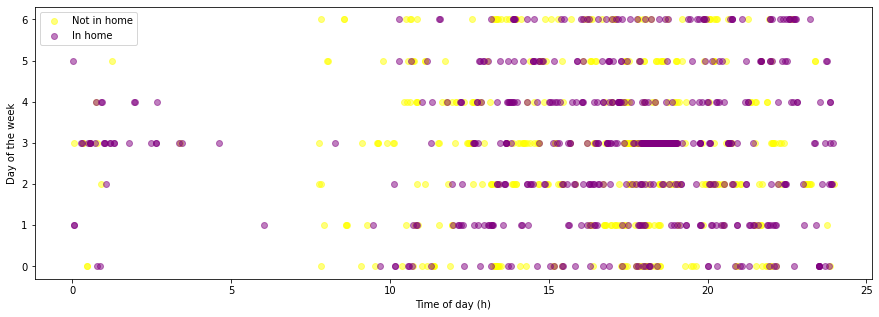

In [344]:
figure, ax  = plt.subplots(figsize = (15,5))
df0 = df_door[df_door.in_home == 0]
df1 = df_door[df_door.in_home == 1]
ax.scatter(df0.d_angle*12/np.pi, df0.week_day, c='yellow', alpha = 0.5, label = 'Not in home')
ax.scatter(df1.d_angle*12/np.pi, df1.week_day, c='purple', alpha = 0.5, label = 'In home')
ax.legend()
ax.set_xlabel('Time of day (h)')
ax.set_ylabel('Day of the week')

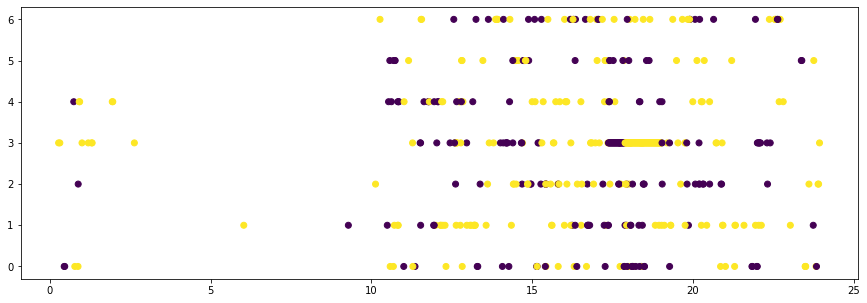

In [1201]:
figure = plt.figure(figsize = (15, 5))
df = df_door[:500]
plt.scatter(df.d_angle*12/np.pi, (df.angle.values*7/2/np.pi).astype(int), c = df.in_home)

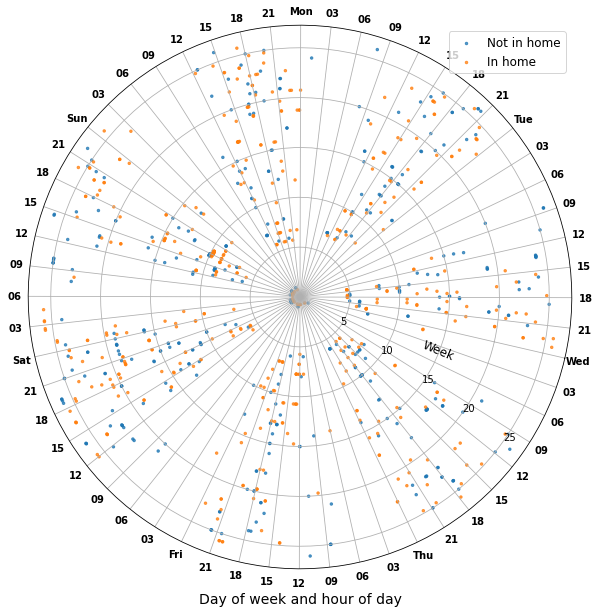

In [339]:
plot_polar(df_door, clas = 'in_home', typ = 6)

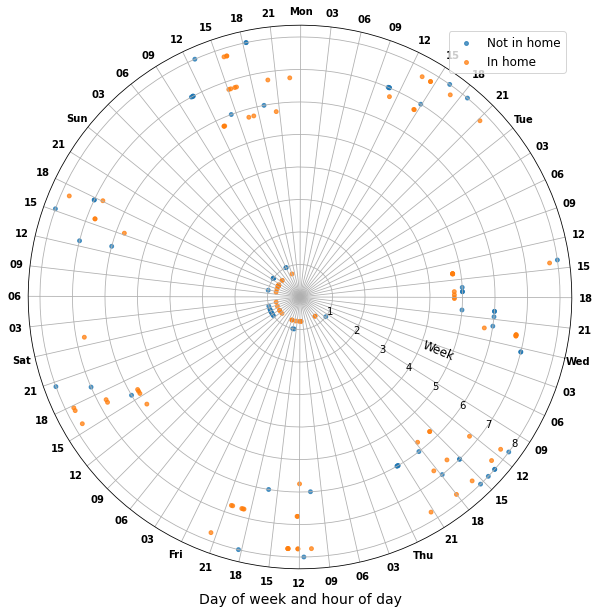

In [340]:
plot_polar(df_door[:180], clas = 'in_home', typ = 15)

In [1213]:
#%%timeit
dx = algo_going_in_out(df_entrance.copy()[:100], df_home.copy())

136 ms ± 1.92 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


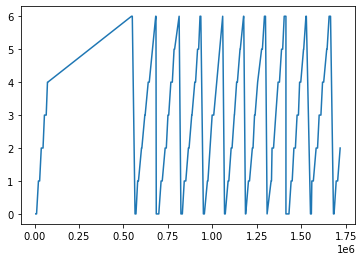

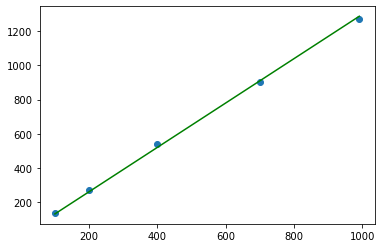

In [1217]:
#algo timing: Big O(n) (see graphic)
xxx = [100, 200, 400, 700, 991]
plt.scatter(xxx, [136, 272, 541, 904, 1270])
plt.plot(xxx, xxx*np.array([1.3]), color = 'green')

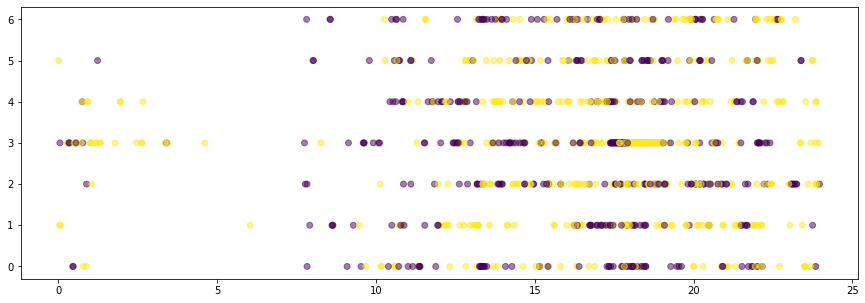

In [343]:
n = 10000
fig = plt.figure(figsize=(15,5))
plt.scatter(df_door.d_angle*12/np.pi, df_door.week_day, c=df_door.in_home,alpha =0.5)

In [1381]:
df_door

,value_id,sensor_id,timestamp,value,date,angle,radius,color,d_angle,d_radius,total_angle,in_home,week_day
6574,19486463,5888,2020-02-26 11:21:37.807373,1,2020-02-26 11:21:37.807373,0.424882,1.0,6,2.974171,1.0,2.974171,0.0,0.0
10912,19937635,5888,2020-02-26 18:09:18.856512,1,2020-02-26 18:09:18.856512,0.679005,1.0,6,4.753032,1.0,4.753032,1.0,0.0
10922,19938724,5888,2020-02-26 18:10:18.908249,1,2020-02-26 18:10:18.908249,0.679628,1.0,6,4.757399,1.0,4.757399,1.0,0.0
21492,21041622,5888,2020-02-27 10:49:18.952935,1,2020-02-27 10:49:18.952935,1.302338,1.0,6,2.833184,2.0,9.116369,1.0,1.0
21502,21042733,5888,2020-02-27 10:50:18.995829,1,2020-02-27 10:50:18.995829,1.302962,1.0,6,2.837550,2.0,9.120735,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3086608,252192818,5888,2020-08-24 20:34:00.119608,1,2020-08-24 20:34:00.119608,5.257450,26.0,6,5.386222,181.0,1136.359577,0.0,5.0
3095208,252708768,5888,2020-08-25 08:32:30.524556,1,2020-08-25 08:32:30.524556,5.705319,26.0,6,2.238119,182.0,1139.494660,0.0,6.0
3095220,252709501,5888,2020-08-25 08:33:30.567470,1,2020-08-25 08:33:30.567470,5.705942,26.0,6,2.242485,182.0,1139.499026,0.0,6.0
3105349,253317375,5888,2020-08-25 22:17:05.294630,1,2020-08-25 22:17:05.294630,6.219306,26.0,6,5.836032,182.0,1143.092572,1.0,6.0


In [1220]:
n = len(df_door)
print(f"Total length of data {n}")
test_n = int(n*0.3)
print(f"Train data length {n-test_n}")
X_y = df_door.iloc[:,[8,12,11]].values
np.random.shuffle(X_y)
print(X_y.shape)

Total length of data 991
Train data length 694
(991, 3)


In [1221]:
X_test = X_y[:-test_n,:2]
X_train = X_y[test_n:, :2]
Y_test = X_y[:-test_n,2]
Y_train = X_y[test_n:, 2]
print(f"X_test shape {X_test.shape}; Y_test shape {Y_test.shape}")

X_test shape (694, 2); Y_test shape (694,)


In [1431]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, Y_train)
  
# making predictions on the testing set
y_pred = gnb.predict(X_test)
y_pred_train = gnb.predict(X_train)
  
# comparing actual response values (y_test) with predicted response values (y_pred)
from sklearn import metrics
print("Gaussian Naive Bayes model accuracy(in %):", metrics.accuracy_score(Y_test, y_pred)*100)
print("Gaussian Nive Bayes model train set accuracy (in %):", metrics.accuracy_score(Y_train, y_pred_train)*100)

Gaussian Naive Bayes model accuracy(in %): 55.763688760806915
Gaussian Nive Bayes model train set accuracy (in %): 58.35734870317003


In [1225]:
from sklearn.naive_bayes import BernoulliNB
gnb = BernoulliNB()
gnb.fit(X_train, Y_train)
  
# making predictions on the testing set
y_pred = gnb.predict(X_test)
  
# comparing actual response values (y_test) with predicted response values (y_pred)
from sklearn import metrics
print("Bernoulli Naive Bayes model accuracy(in %):", metrics.accuracy_score(Y_test, y_pred)*100)

Bernoulli Naive Bayes model accuracy(in %): 55.763688760806915


In [1432]:
from sklearn.naive_bayes import CategoricalNB
gnb = CategoricalNB()
gnb.fit(X_train, Y_train)
  
# making predictions on the testing set
y_pred = gnb.predict(X_test)
y_pred_train = gnb.predict(X_train)
  
# comparing actual response values (y_test) with predicted response values (y_pred)
from sklearn import metrics
print("Categorical Naive Bayes model accuracy(in %):", metrics.accuracy_score(Y_test, y_pred)*100)
print("Gaussian Nive Bayes model train set accuracy (in %):", metrics.accuracy_score(Y_train, y_pred_train)*100)

Categorical Naive Bayes model accuracy(in %): 58.789625360230545
Gaussian Nive Bayes model train set accuracy (in %): 62.96829971181557


In [1227]:
from sklearn.naive_bayes import MultinomialNB
gnb = MultinomialNB()
gnb.fit(X_train, Y_train)
  
# making predictions on the testing set
y_pred = gnb.predict(X_test)
  
# comparing actual response values (y_test) with predicted response values (y_pred)
from sklearn import metrics
print("Multinominal Naive Bayes model accuracy(in %):", metrics.accuracy_score(Y_test, y_pred)*100)

Multinominal Naive Bayes model accuracy(in %): 54.610951008645536


In [1241]:
from sklearn.naive_bayes import ComplementNB
gnb = ComplementNB()
gnb.fit(X_train, Y_train)
  
# making predictions on the testing set
y_pred = gnb.predict(X_test)
y_pred_train = gnb.predict(X_train)
# comparing actual response values (y_test) with predicted response values (y_pred)
from sklearn import metrics
print("Complement Naive Bayes model accuracy(in %):", metrics.accuracy_score(Y_test, y_pred)*100)
print("Complement Naice Bayes model train set accuracy (in %):", metrics.accuracy_score(Y_train, y_pred_train)*100)

Complement Naive Bayes model accuracy(in %): 51.15273775216138
Complement Naice Bayes model train set accuracy (in %): 48.27089337175792


In [1240]:
from sklearn.neighbors import NearestCentroid
clf = NearestCentroid()
clf.fit(X_train, Y_train)
y_pred = clf.predict(X_test)
y_pred_train = clf.predict(X_train)
# comparing actual response values (y_test) with predicted response values (y_pred)
from sklearn import metrics
print("Nearest Centroid model accuracy(in %):", metrics.accuracy_score(Y_test, y_pred)*100)
print("Nearest Centroid model train set accuracy (in %):", metrics.accuracy_score(Y_train, y_pred_train)*100)

Nearest Centroid model accuracy(in %): 56.48414985590778
Nearest Centroid model train set accuracy (in %): 54.899135446685875


In [1230]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
clf.fit(X_train, Y_train)
y_pred = clf.predict(X_test)
y_pred_train = clf.predict(X_train)
# comparing actual response values (y_test) with predicted response values (y_pred)
from sklearn import metrics
print("Decision Tree model test set accuracy (in %):", metrics.accuracy_score(Y_test, y_pred)*100)
print("Decision Tree model train set accuracy (in %):", metrics.accuracy_score(Y_train, y_pred_train)*100)

Decision Tree model test set accuracy (in %): 84.87031700288185
Decision Tree model train set accuracy (in %): 100.0


In [1433]:
from sklearn.neural_network import MLPClassifier
clf = MLPClassifier(solver='lbfgs', alpha=1e-6, hidden_layer_sizes=(5, 2), random_state=1)
clf.fit(X_train, Y_train)
y_pred = clf.predict(X_test)
y_pred_train = clf.predict(X_train)
# comparing actual response values (y_test) with predicted response values (y_pred)
from sklearn import metrics
print("KNN model accuracy(in %):", metrics.accuracy_score(Y_test, y_pred)*100)
print("KNN model train set accuracy (in %):", metrics.accuracy_score(Y_train, y_pred_train)*100)

KNN model accuracy(in %): 56.195965417867434
KNN model train set accuracy (in %): 58.789625360230545


In [32]:
df_door

,value_id,sensor_id,timestamp,value,date,angle,radius,color,d_angle,d_radius,total_angle,coming_in,week_day
6574,19486463,5888,2020-02-26 11:21:37.807373,1,2020-02-26 11:21:37.807373,0.424882,1.0,6,2.974171,1.0,2.974171,-1.0,0.0
10912,19937635,5888,2020-02-26 18:09:18.856512,1,2020-02-26 18:09:18.856512,0.679005,1.0,6,4.753032,1.0,4.753032,1.0,0.0
10922,19938724,5888,2020-02-26 18:10:18.908249,1,2020-02-26 18:10:18.908249,0.679628,1.0,6,4.757399,1.0,4.757399,1.0,0.0
21492,21041622,5888,2020-02-27 10:49:18.952935,1,2020-02-27 10:49:18.952935,1.302338,1.0,6,2.833184,2.0,9.116369,-1.0,1.0
21502,21042733,5888,2020-02-27 10:50:18.995829,1,2020-02-27 10:50:18.995829,1.302962,1.0,6,2.837550,2.0,9.120735,-1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3086608,252192818,5888,2020-08-24 20:34:00.119608,1,2020-08-24 20:34:00.119608,5.257450,26.0,6,5.386222,181.0,1136.359577,1.0,5.0
3095208,252708768,5888,2020-08-25 08:32:30.524556,1,2020-08-25 08:32:30.524556,5.705319,26.0,6,2.238119,182.0,1139.494660,-1.0,6.0
3095220,252709501,5888,2020-08-25 08:33:30.567470,1,2020-08-25 08:33:30.567470,5.705942,26.0,6,2.242485,182.0,1139.499026,-1.0,6.0
3105349,253317375,5888,2020-08-25 22:17:05.294630,1,2020-08-25 22:17:05.294630,6.219306,26.0,6,5.836032,182.0,1143.092572,1.0,6.0


In [33]:
start.weekday()

2

### Unsupervised: Clustering

In [34]:
def plot_elbow_curve(XX, nn = 20):
    Nc = range(1, nn)
    kmeans = [KMeans(n_clusters=i) for i in Nc]
    kmeans
    score = [kmeans[i].fit(XX).score(XX) for i in range(len(kmeans))]
    score
    plt.plot(Nc,score)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Score')
    plt.title('Elbow Curve')
    plt.show()

In [35]:
def cluster_predict_show(XX, k = 7):
    nn = XX.shape[1]
    kmeans = KMeans(n_clusters=k).fit(XX)
    centroids = kmeans.cluster_centers_
    # Predicting the clusters
    labels = kmeans.predict(XX)
    # Getting the cluster centers
    C = kmeans.cluster_centers_
    colores=['red','green','blue','cyan','yellow', 'orange', 'purple', 'pink', 'slategray'][:k]
    asignar=[]
    for row in labels:
        asignar.append(colores[row])
    
    fig, ax = plt.subplots(figsize=(30, 10))
    if nn >= 3: 
        ax = plt.axes(projection='3d')
        ax.scatter3D(XX[:, 0], XX[:, 1], XX[:, 2], c=asignar,s=60)
    elif nn == 2: ax.scatter(XX[:,0], XX[:,1], c=asignar)
    else: plt.plot(XX, c = asignar)
        
    #plt.ylim([.15, .95])
    #plt.xlim([.15, .95])
    plt.show()
    return centroids, asignar
    #ax.scatter(C[:, 0], C[:, 1], C[:, 2], marker='*', c=colores, s=1000)

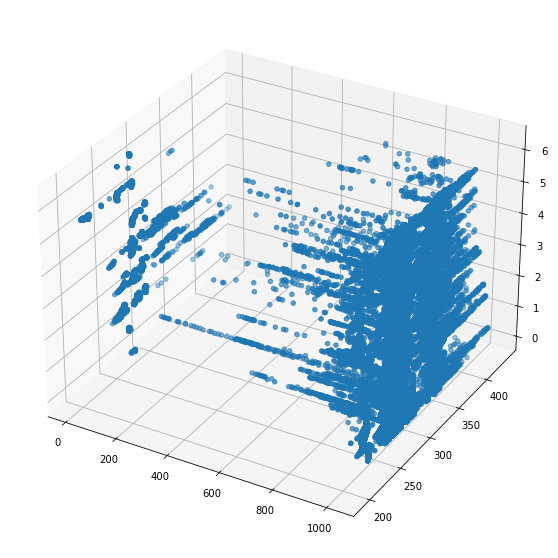

In [12]:
id0 = 6127 #tv
id1 = 5889 #couch
id2 = 5891 #livingroom
n = 135000
df0 = sen_int[sen_int.sensor_id.isin([id0])][20:n+20] #247757
df1 = sen_int[sen_int.sensor_id.isin([id1])][:n] #178738
df2 = sen_int[sen_int.sensor_id.isin([id2])][:n] #246340
fig, ax = plt.subplots(figsize=(30, 10))
ax = plt.axes(projection='3d')
ax.scatter3D(df0.value, df1.value, df0.angle);
#plt.ylim([.15, .95])
#plt.xlim([.15, .95])
plt.show()

In [37]:

df_livingroom = sen_int[sen_int.sensor_id.isin([id0, id1])]

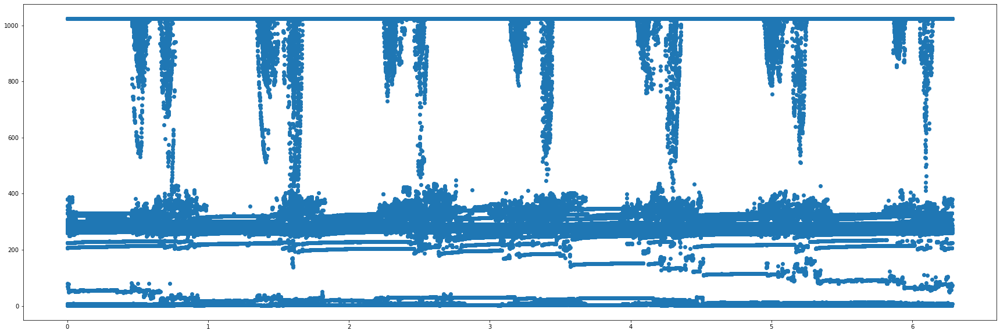

In [38]:
fig, ax = plt.subplots(figsize=(30, 10))
ax.scatter(df_livingroom.angle, df_livingroom.value);
#plt.ylim([.15, .95])
#plt.xlim([4, 20])
plt.show()

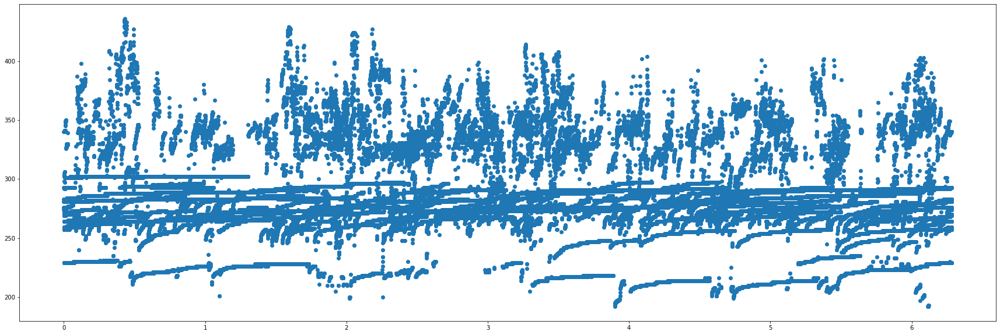

In [39]:
ig, ax = plt.subplots(figsize=(30, 10))
ax.scatter(df0.angle, df1.value);
#plt.ylim([.15, .95])
#plt.xlim([4, 20])
plt.show()

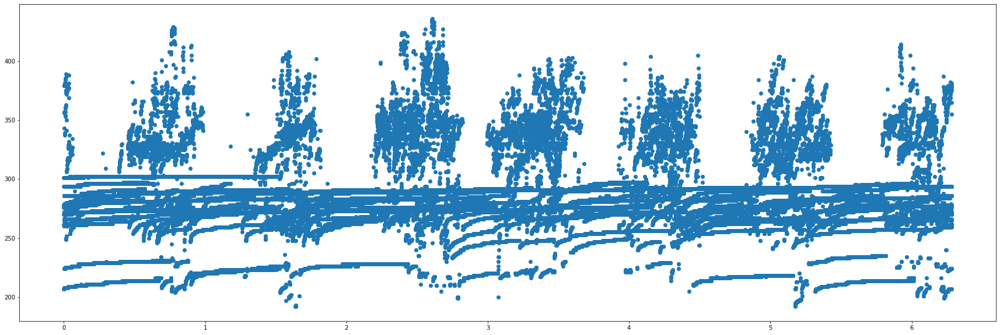

In [40]:
ig, ax = plt.subplots(figsize=(30, 10))
ax.scatter(df1.angle, df1.value);
#plt.ylim([.15, .95])
#plt.xlim([4, 20])
plt.show()

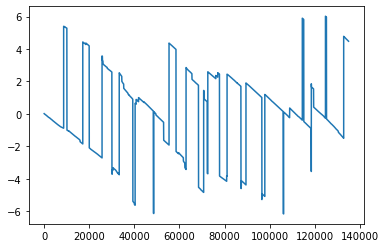

In [41]:
plt.plot(np.array(df0.angle) - np.array(df1.angle))

In [42]:
df7 = df_livingroom[(df_livingroom.value < 1020) & (df_livingroom.value > 100)]

In [43]:
df70 = df7[df7.sensor_id == id0]
df71 = df7[df7.sensor_id == id1]

In [44]:
len(df70), len(df71)

(6738, 160885)

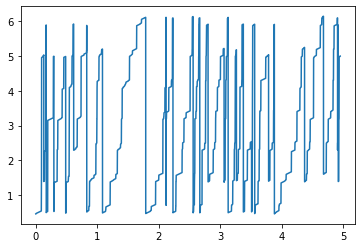

In [45]:
plt.plot(df71.angle[:6738], df70.angle)

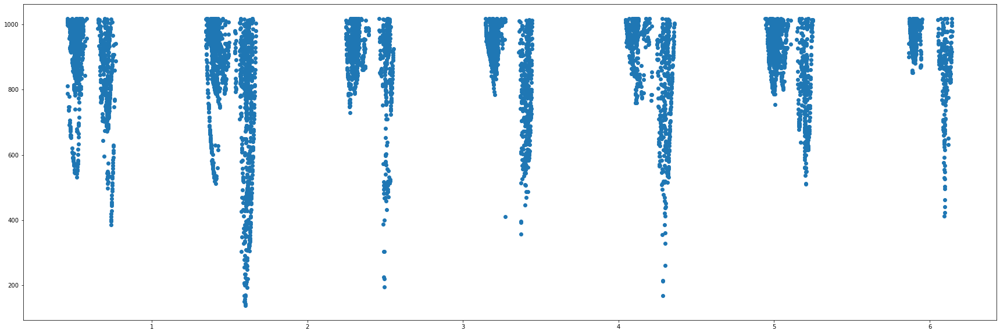

In [46]:
nnn = -1#178738
fig, ax = plt.subplots(figsize=(30, 10))
ax.scatter(df70.angle[:nnn], df70.value[:nnn]);
#plt.ylim([20, 1019])
#plt.xlim([4, 20])
plt.show()

In [47]:
X = np.zeros((len(df70),2))
X[:,0] = df70.angle
X[:,1] = df70.value*6/1000

In [48]:
len(X)

6738

In [49]:
clt = DBSCAN()
model = clt.fit(X)
clusters = model.fit_predict(X)

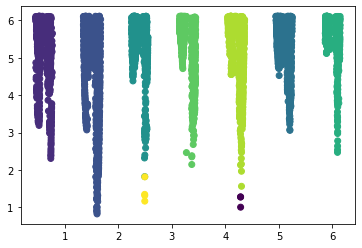

In [50]:
plt.scatter(X[:,0], X[:,1], c=clusters)

In [57]:
df_tv = pd.DataFrame({'hour': (X[:,0]*7%(2*np.pi))*12/np.pi, 'value': X[:,1]*1000/6,'class':clusters })

In [ ]:
df_tv['class'].unique()

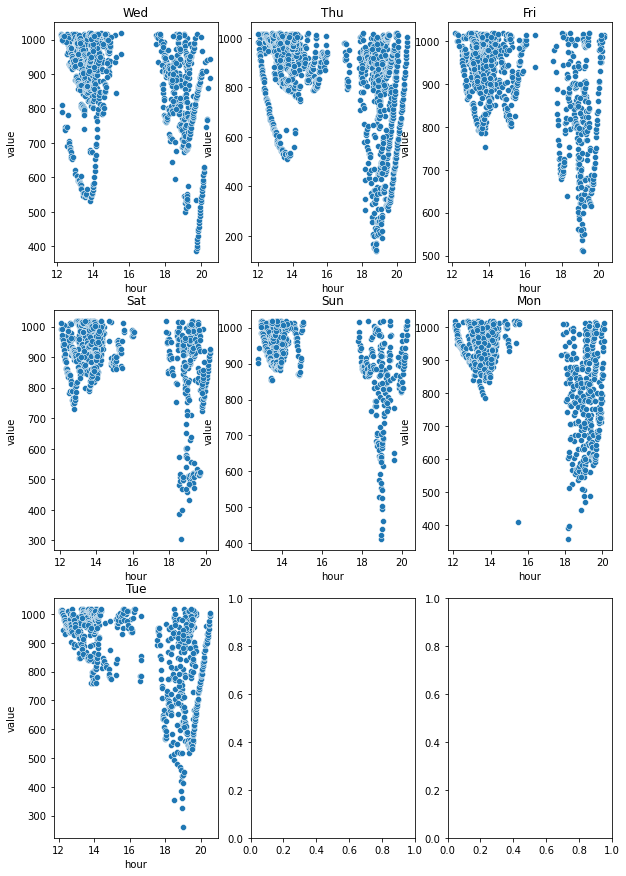

In [58]:
import seaborn as sns
fig, axs = plt.subplots(nrows=3,ncols=3, figsize = (10,15))
for i in range (7):
    df = df_tv[df_tv['class'] == i]
    sns.scatterplot(x = 'hour',y='value', data=df, ax=axs[i//3][i%3]).set_title(weekdays[i])
    

In [ ]:
Z = linkage(X, 'ward')

In [ ]:
plt.figure(figsize=(25, 10))
plt.title('Iris Hierarchical Clustering Dendrogram')
plt.xlabel('Species')
plt.ylabel('distance')
TT = dendrogram(
    Z,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=8,                  # Try changing values of p
    leaf_rotation=90.,      # rotates the x axis labels
    leaf_font_size=8.,      # font size for the x axis labels
)
max_d = 2000
plt.axhline(y=max_d, c='k')
plt.show()

In [ ]:
# spectral clustering
from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.cluster import SpectralClustering
from matplotlib import pyplot
# define dataset
# define the model
model = SpectralClustering(n_clusters=2)
# fit model and predict clusters
yhat = model.fit_predict(X)
# retrieve unique clusters
clusters = unique(yhat)
# create scatter plot for samples from each cluster
for cluster in clusters:
    # get row indexes for samples with this cluster
    row_ix = where(yhat == cluster)
    # create scatter of these samples
    pyplot.scatter(X[row_ix, 0], X[row_ix, 1])
# show the plot
pyplot.show()

In [ ]:
nnn = 130000#6738#178738
fig, ax = plt.subplots(figsize=(30, 10))
ax.scatter(df71.angle[620:nnn+620], df71.value[620:nnn+620]);
#plt.ylim([20, 1019])
#plt.xlim([4, 20])
plt.show()

In [ ]:
l = [i for i in range(0, len(X), 100) if np.std(X[i:i+100,1]) > 0.1]
bp = 100
W = [i for i in range(0, len(X), bp) if np.std(X[i:i+bp,:]) > 40]
Y = np.zeros((len(l)*bp,2))
print(Y.shape)
for i in l:
    j = l.index(i)*bp
    try: Y[j:j+bp,:] = X[i:i+bp,:]
    except: next
plt.scatter(Y[:,0], Y[:,1])

In [ ]:
kmeans = KMeans(n_clusters=7).fit(Y)
centroids = kmeans.cluster_centers_
labels = kmeans.predict(Y)
plt.scatter(Y[:,0], Y[:,1], c = labels)

In [ ]:
df71

In [ ]:
X = df71.iloc[:,[5,3]].values

In [ ]:
l = [i for i in range(0, len(X), 100) if np.std(X[i:i+100,1]) > 10]
bp = 100
W = [i for i in range(0, len(X), bp) if np.std(X[i:i+bp,:]) > 40]
Y = np.zeros((len(l)*bp,2))
print(Y.shape)
for i in l:
    j = l.index(i)*bp
    try: Y[j:j+bp,:] = X[i:i+bp,:]
    except: next
fig, ax = plt.subplots(figsize=(15,5))
ax.scatter(Y[:,0], Y[:,1])

In [ ]:
m0, m1 = max(Y[:,0]), max(Y[:,1])

In [ ]:
Y[:,1] = Y[:,1]*m0/m1/2

In [ ]:
kmeans = KMeans(n_clusters=7).fit(Y)
centroids = kmeans.cluster_centers_
labels = kmeans.predict(Y)
plt.scatter(Y[:,0], Y[:,1], c = labels)

In [ ]:
np.unique(labels)

In [ ]:
df_couch = pd.DataFrame({'hour': (Y[:,0]*7%(2*np.pi))*12/np.pi, 'value': Y[:,1]*m0/m1/2,'class':labels })
fig, axs = plt.subplots(nrows=3,ncols=3, figsize = (10,15))
for i in range (7):
    df = df_couch[df_couch['class'] == i]
    sns.scatterplot(x = 'hour',y='value', data=df, ax=axs[i//3][i%3]).set_title(weekdays[i])

In [ ]:
len(Y)

In [ ]:
36400 - 6738*5

In [ ]:
X1 = np.zeros((36400, 2))
for i in range(5):
    X1[6738*i: 6738*(i+1),:] = X
X1[-2710:,:] = X[:2710,:]

In [ ]:
fig, ax = plt.subplots(figsize=(15,5))
ax.scatter(X1[:,0], X1[:,1])

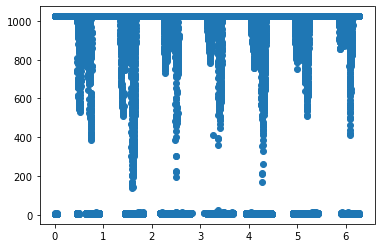

In [13]:
df00 = sen_int[sen_int.sensor_id == id0]
df01 = sen_int[sen_int.sensor_id == id1]
plt.scatter(df00.angle, df00.value)

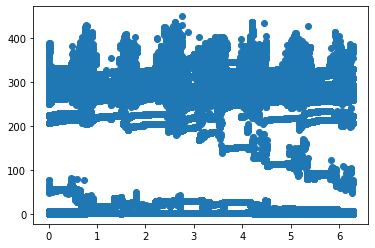

In [14]:
plt.scatter(df01.angle, df01.value)

In [15]:
len(df00), len(df01)

(247757, 178738)

In [18]:
X1 = np.zeros((len(df00), 2))
X1[:,0] = df00.angle
X1[:,1] = df00.value
X2 = np.zeros((len(df01), 2))
X2[:,0] = df01.angle
X2[:,1] = df01.value

In [152]:
Y1 = X1[(X1[:,1] > 40) & (X1[:,1] < 1020)]
Y2 = del_non_linear(X2, bp = 100, s = 8)
len(Y1), len(Y2)

(6738, 39100)

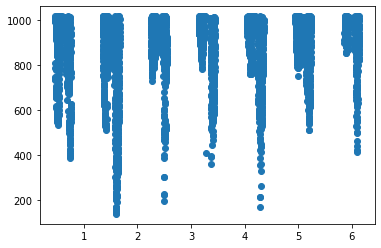

In [153]:
plt.scatter(Y1[:,0], Y1[:,1])

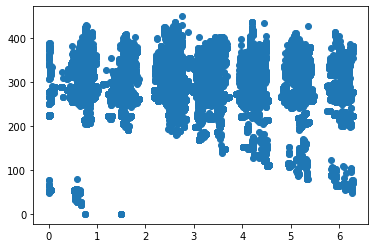

In [154]:
plt.scatter(Y2[:,0], Y2[:,1])

In [155]:
len(Y2)/len(Y1)

5.802908875037103

In [159]:
p = int(len(Y2)/len(Y1))
Z1 = np.zeros((len(Y1)*p, 2))
for i in range(p): Z1[i*len(Y1):len(Y1)*(i+1),:] = Y1

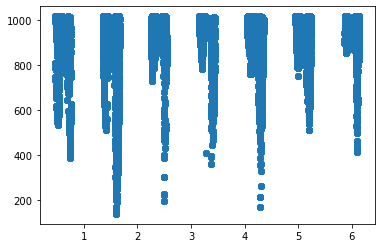

In [160]:
plt.scatter(Z1[:,0], Z1[:,1])

In [162]:
Z2 = Y2[:len(Z1),:]

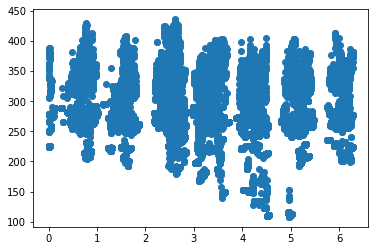

In [163]:
plt.scatter(Z2[:,0], Z2[:,1])

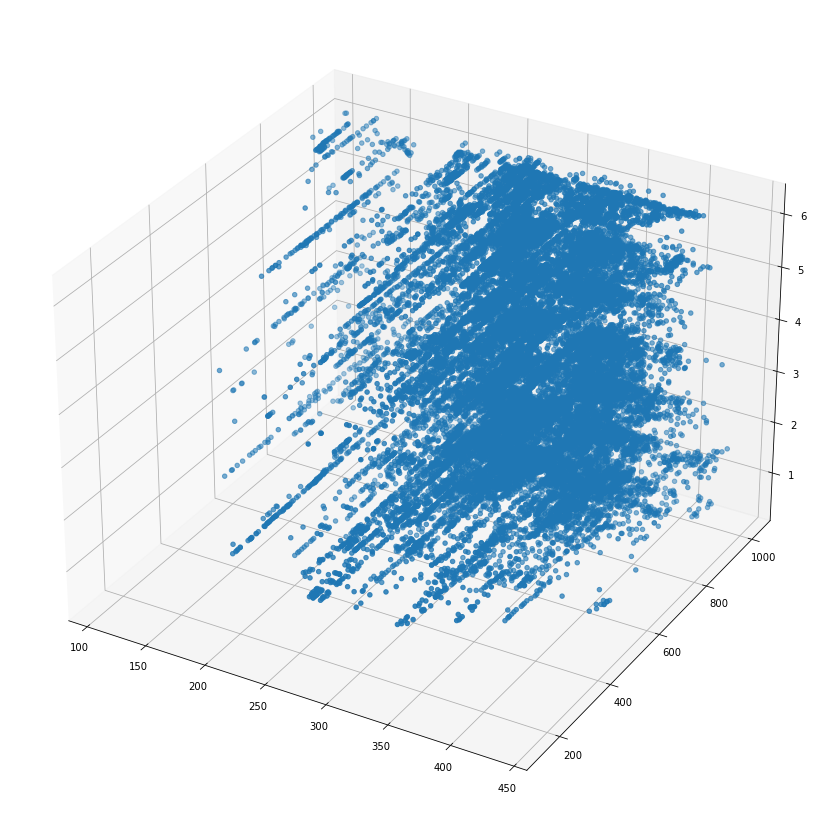

In [166]:
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(projection='3d')
ax.scatter(Z2[:,1], Z1[:,1], Z1[:,0])

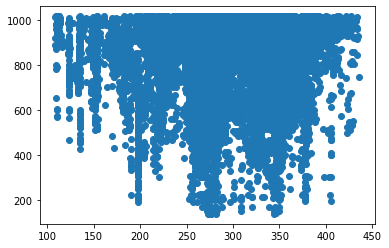

In [172]:
plt.scatter(Z2[:,1], Z1[:,1])

In [173]:
from sklearn.preprocessing import normalize

In [221]:
Z3 = np.zeros((len(Z2), 3))
Z3[:,0] = Z1[:,1]
Z3[:,1] = Z2[:,1]
Z3[:,2] = 0

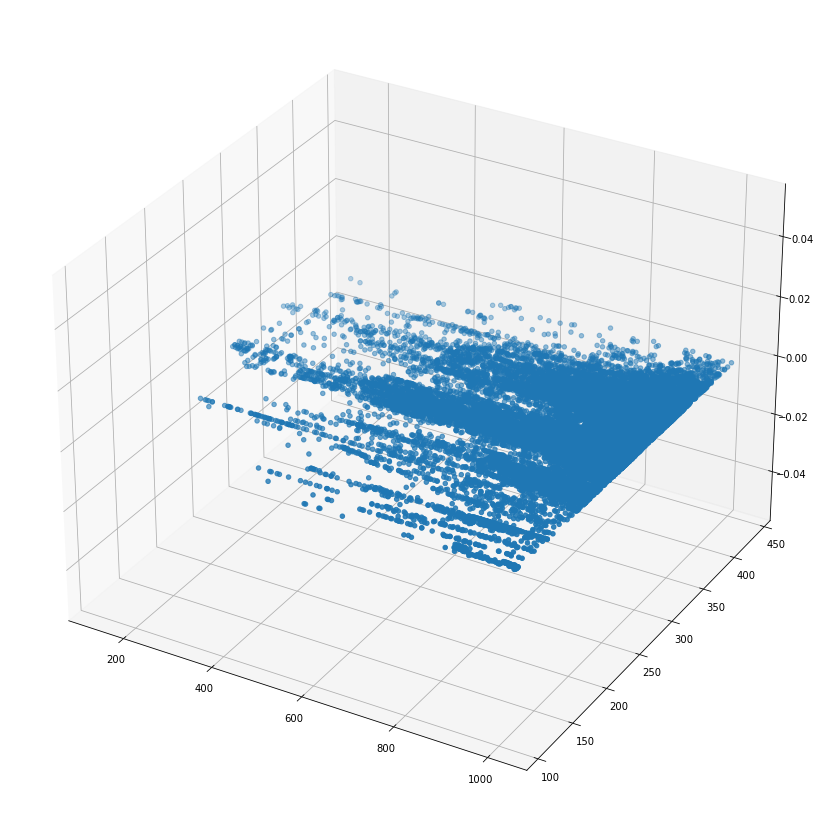

In [222]:
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(projection='3d')
ax.scatter(Z3[:,0], Z3[:,1], Z3[:,2])

In [223]:
Z3_n = MinMaxScaler().fit_transform(Z3)
Z3_n[:,2] = Z2[:,0]

In [224]:
np.max(Z3_n, axis = 0), np.min(Z3_n, axis=0)

(array([1.        , 1.        , 6.28315251]),
 array([0.        , 0.        , 0.00059148]))

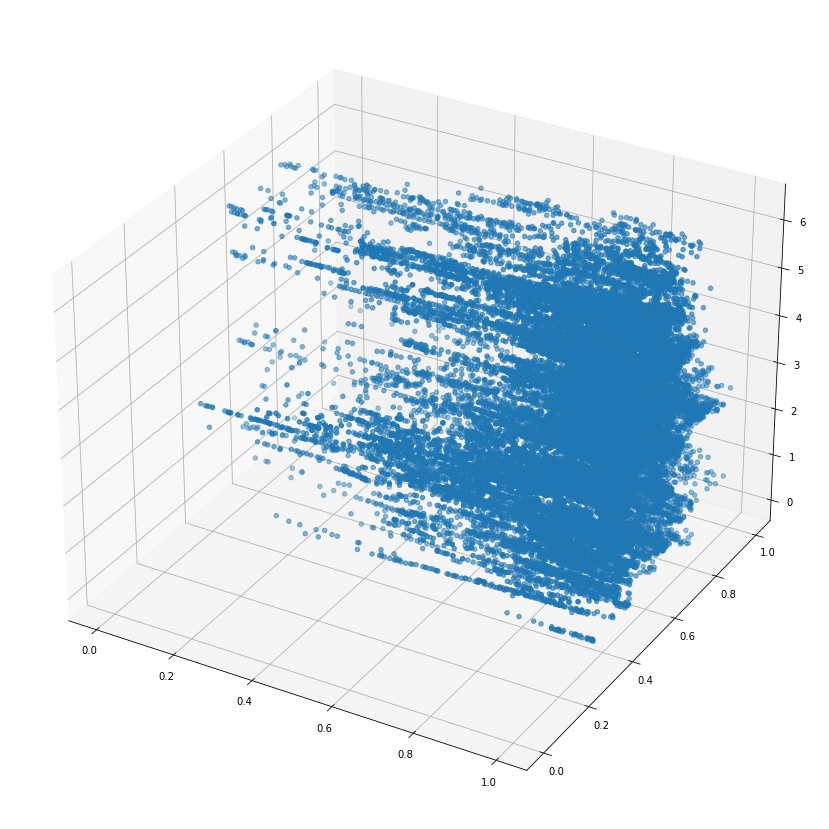

In [225]:
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(projection='3d')
ax.scatter(Z3_n[:,0], Z3_n[:,1], Z3_n[:,2])

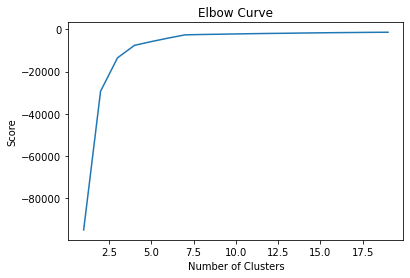

In [226]:
Nc = range(1, 20)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(Z3_n).score(Z3_n) for i in range(len(kmeans))]
score
plt.plot(Nc,score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [227]:
km = KMeans(n_clusters=5).fit(Z3_n)

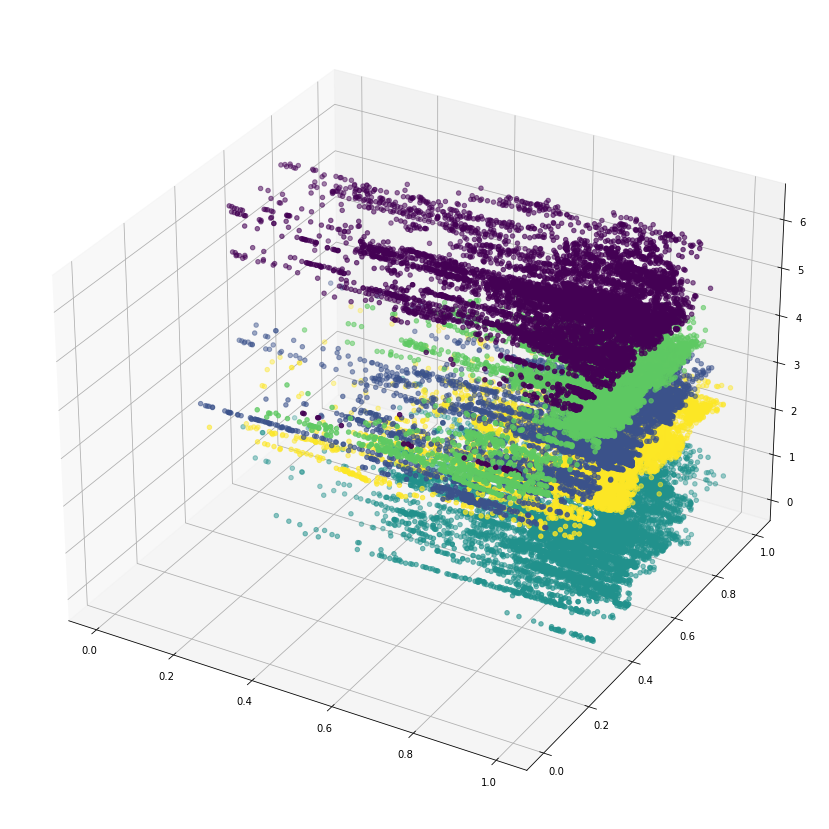

In [228]:
km = KMeans(n_clusters=5).fit(Z3_n)
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(projection='3d')
ax.scatter(Z3_n[:,0], Z3_n[:,1], Z3_n[:,2], c = km.labels_)

In [229]:
sensor

,sensor_id,node_id,type,name,room
0,5894,541150,INT,corridor/ambience/motion,corridor
1,5895,541151,INT,bathroom/ambience/motion,bathroom
2,7125,542381,INT,bathroom/ambience/light,bathroom
3,5896,541152,INT,bedroom/bed/pressure,bedroom
4,6127,541383,INT,livingroom/tv/light,livingroom
5,6220,541444,INT,balcon/door/contact,balcon
6,6253,541509,INT,kitchen/fridge/contact,kitchen
7,6632,541888,FLOAT,kitchen/coffeemaker/current,kitchen
8,6633,541889,FLOAT,kitchen/sandwichmaker/current,kitchen
9,6634,541890,FLOAT,kitchen/dishwasher/current,kitchen


188383

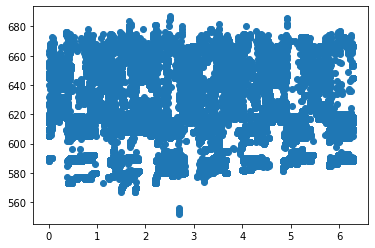

In [250]:
df_bed = sen_int[sen_int.sensor_id == 5896]
plt.scatter(df_bed.angle[:100000], df_bed.value[:100000])
len(df_bed)

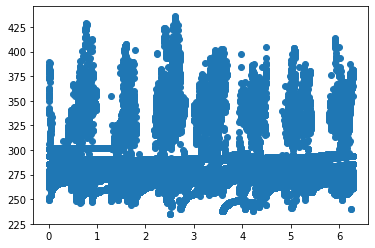

In [251]:
df_bed = sen_int[sen_int.sensor_id == 5889]
plt.scatter(df_bed.angle[:100000], df_bed.value[:100000])

In [257]:
n = 100000
A = np.zeros((n, 3))
A[:,0] = sen_int[sen_int.sensor_id == 5889][:n].value
A[:,1] = sen_int[sen_int.sensor_id == 5896][:n].value
A[:,2] = sen_int[sen_int.sensor_id == 5896][:n].angle

In [258]:
A_n = MinMaxScaler().fit_transform(A)

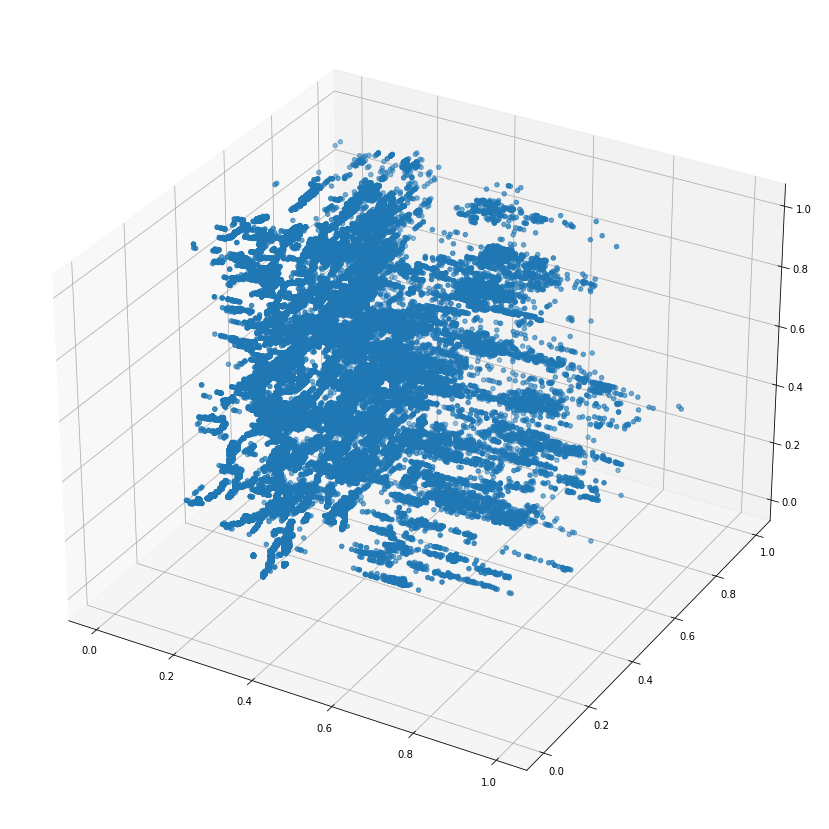

In [259]:
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(projection='3d')
ax.scatter(A_n[:,0], A_n[:,1], A_n[:,2])

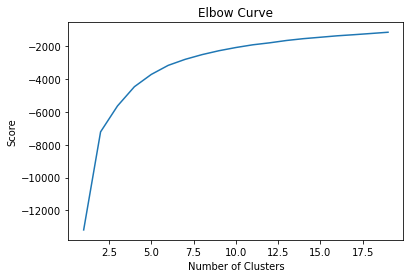

In [260]:
Nc = range(1, 20)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(A_n).score(A_n) for i in range(len(kmeans))]
score
plt.plot(Nc,score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

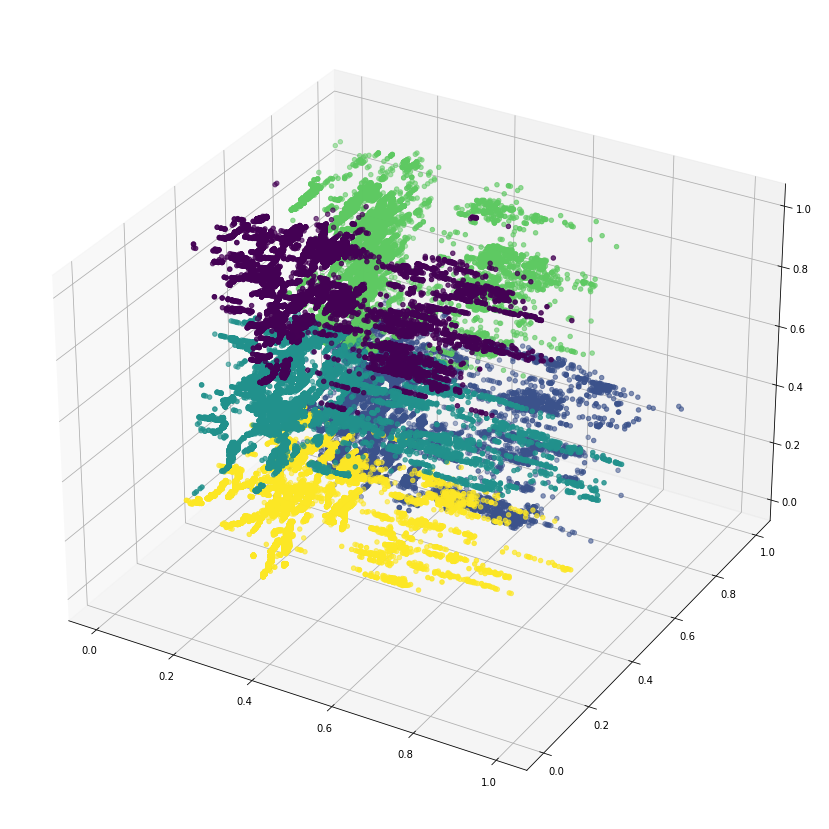

In [261]:
km = KMeans(n_clusters=5).fit(A_n)
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(projection='3d')
ax.scatter(A_n[:,0], A_n[:,1], A_n[:,2], c = km.labels_)

In [262]:
km.cluster_centers_

array([[0.27258313, 0.40610884, 0.83870496],
       [0.27347486, 0.74943826, 0.21817914],
       [0.24674491, 0.41088802, 0.47851579],
       [0.23249934, 0.74212454, 0.70694848],
       [0.25456107, 0.40117648, 0.16910592]])

In [13]:
sensor

,sensor_id,node_id,type,name,room
0,5894,541150,INT,corridor/ambience/motion,corridor
1,5895,541151,INT,bathroom/ambience/motion,bathroom
2,7125,542381,INT,bathroom/ambience/light,bathroom
3,5896,541152,INT,bedroom/bed/pressure,bedroom
4,6127,541383,INT,livingroom/tv/light,livingroom
5,6220,541444,INT,balcon/door/contact,balcon
6,6253,541509,INT,kitchen/fridge/contact,kitchen
7,6632,541888,FLOAT,kitchen/coffeemaker/current,kitchen
8,6633,541889,FLOAT,kitchen/sandwichmaker/current,kitchen
9,6634,541890,FLOAT,kitchen/dishwasher/current,kitchen


In [14]:
x1 = sen_int[sen_int.sensor_id == 6686]
x2 = sen_int[sen_int.sensor_id == 5892]

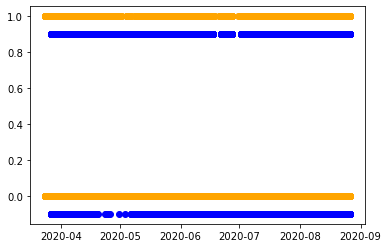

In [19]:
plt.scatter(x1.date, x1.value, c='orange')
plt.scatter(x2.date[-len(x1):], x2.value[-len(x1):]-0.1, c='blue')

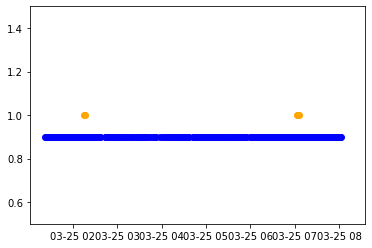

In [68]:
nnn = 400
ini = 1500
too = ini+nnn
dif = 37900#41249
plt.ylim(0.5, 1.5)
plt.scatter(x1.date[ini:too], x1.value[ini:too], c='orange')
plt.scatter(x2.date[ini+dif:too+dif], x2.value[ini+dif:too+dif]-0.1, c='blue')

In [166]:
id_p = 5896
id_u = 6686
id_a = 5892

dfu = sen_int[sen_int.sensor_id == id_u]
dfp = sen_int[sen_int.sensor_id == id_p]
dfa = sen_int[sen_int.sensor_id == id_a]
len(dfu), len(dfp), len(dfa)

(206430, 188383, 247679)

In [117]:
dfu = sen_int[sen_int.sensor_id == id_u]
dfu = dfu[dfu.value != 0]
len(dfu)

11683

In [136]:
dfa = sen_int[sen_int.sensor_id == id_a]
dfa = dfa[dfa.value != 0]
len(dfa)

75868

In [137]:
dfa.iloc[0]

value_id                         19193679
sensor_id                            5892
timestamp      2020-02-26 06:57:24.487078
value                                   1
date           2020-02-26 06:57:24.487078
angle                            0.260183
radius                                  1
color                                   2
d_angle                           1.82128
d_radius                                1
total_angle                       1.82128
Name: 4028, dtype: object

In [133]:
dfu.iloc[38]

value_id                         61619991
sensor_id                            6686
timestamp      2020-03-25 00:55:44.299289
value                                   1
date           2020-03-25 00:55:44.299289
angle                           0.0347842
radius                                  5
color                                   2
d_angle                          0.243489
d_radius                               29
total_angle                       176.173
Name: 439267, dtype: object

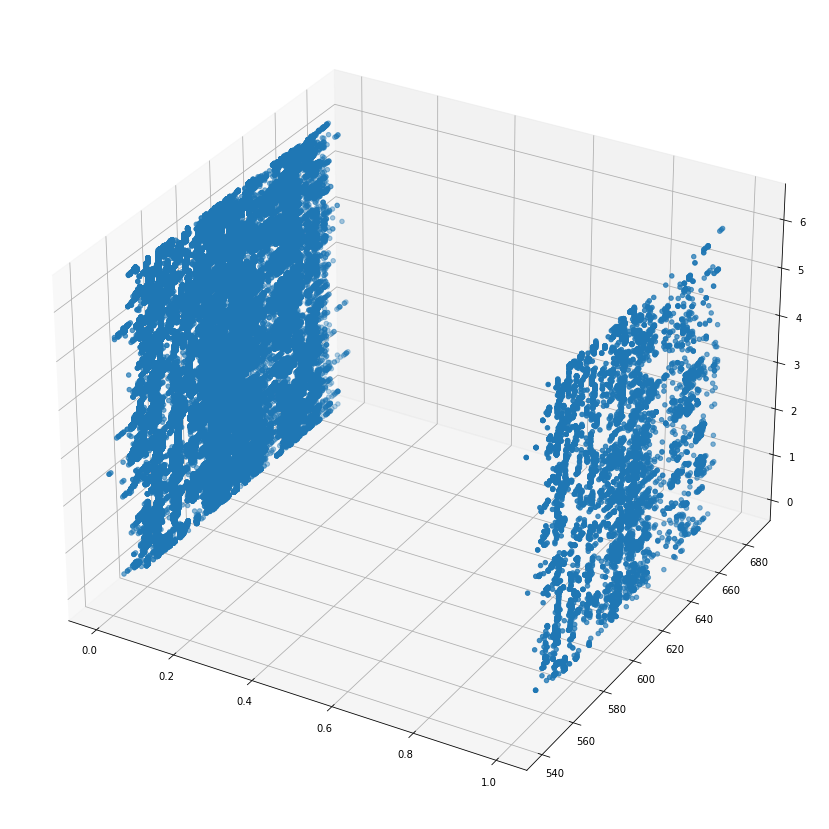

In [111]:
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(projection='3d')
ax.scatter(X[:,0], X[:,1], X[:,3])

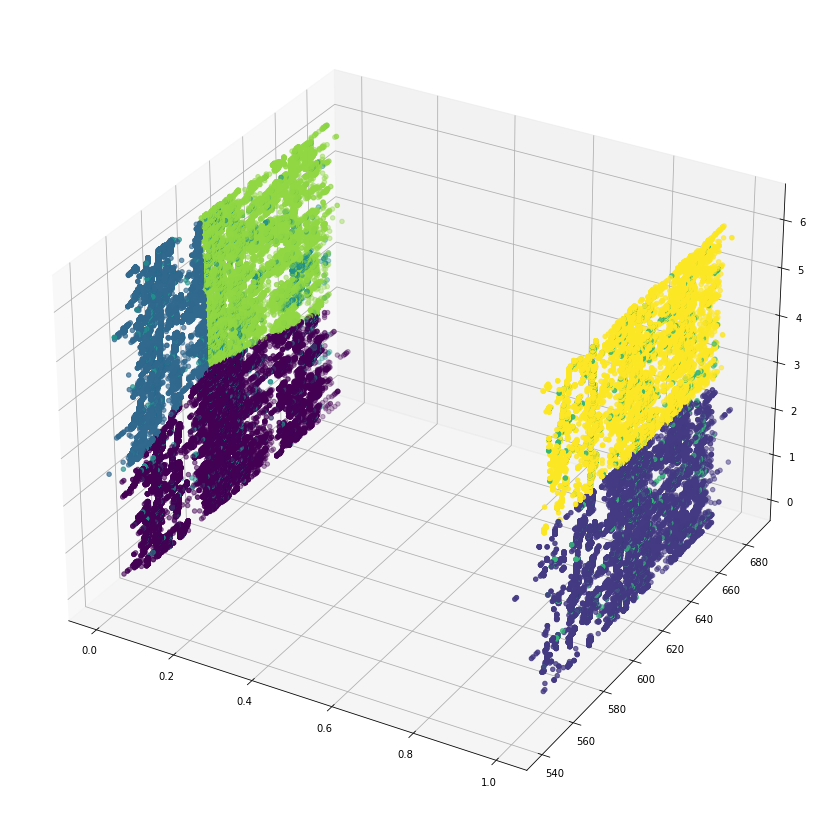

In [116]:
Y = MinMaxScaler().fit_transform(X)
km = KMeans(n_clusters=7).fit(Y)
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(projection='3d')
ax.scatter(X[:,2], X[:,1], X[:,3], c = km.labels_)

In [103]:
dfu.iloc[0], dfu.iloc[0].date.weekday()

(value_id                         61559154
 sensor_id                            6686
 timestamp      2020-03-25 00:00:41.077992
 value                                   0
 date           2020-03-25 00:00:41.077992
 angle                         0.000467399
 radius                                  5
 color                                   2
 d_angle                        0.00327179
 d_radius                               28
 total_angle                       175.932
 Name: 438590, dtype: object,
 2)

In [ ]:
dif = 37
n = 11683-dif
ddfu =  dfu[dfu.value != 0][:n]
ddfp = dfp[:n]

In [ ]:
def generate_x(l_df):
    ldf = []
    for df in l_df:
        x = df[df.value != 0].

In [1483]:
X = np.zeros((len(dfu), 4))
X[:,0] = dfu.value
X[:,1] = dfp.value
X[:,2] = dfa.value
X[:,3] = dfa.angle

ValueError: could not broadcast input array from shape (188383) into shape (206430)

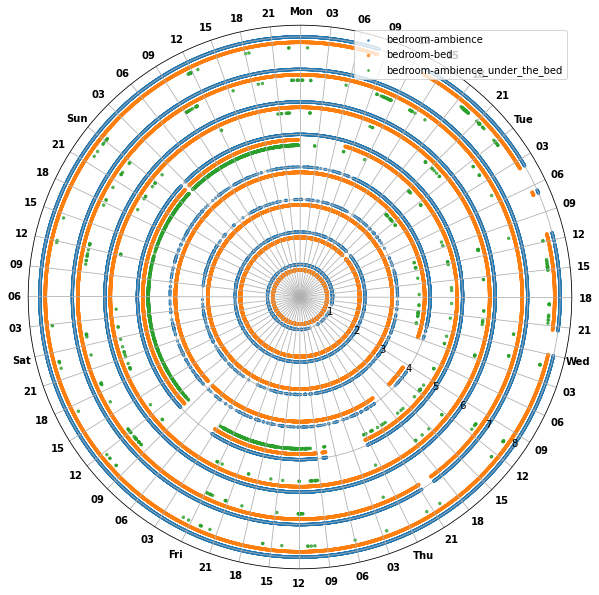

In [1459]:
df_bedroom = sen_int[sen_int.sensor_id.isin([id_p, id_u, id_a])][:177000]
plot_polar(df_bedroom, rdim_fe = {0:5, 1:.01, 2:6})

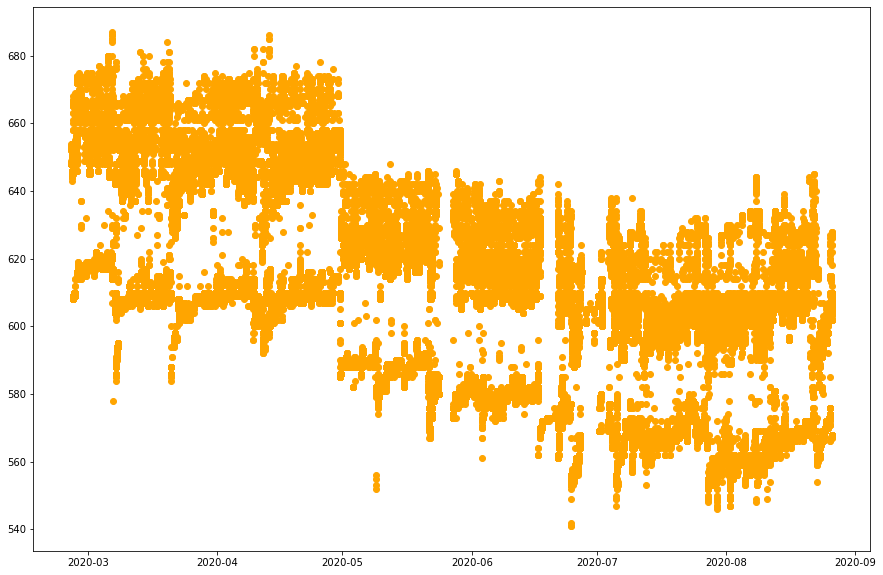

In [1463]:
figure = plt.figure(figsize = (15,10))
plt.scatter(dfp.date, dfp.value, c='orange')

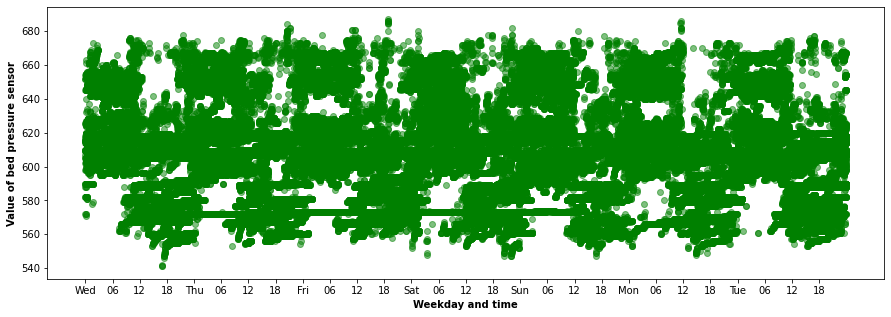

In [2027]:
plot_cartesian(dfp.angle, dfp.value, figsize=(15,5))

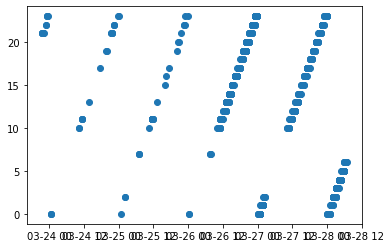

In [165]:
df = dfu[dfu.value != 0][:1000]
plt.scatter(df.date, df.date.dt.hour)

In [1481]:
df1 = dfu[dfu.value == 0]
df2 = dfa[dfa.value != 0][4700:]

In [1484]:
def generate_X (l_df, err_min = 3):
    # total angle, 2*np.pi = 1 day (starting from "start")
    ln = [len(x) for x in l_df]
    min_i = ln.index(min(ln))
    df = l_df[min_i]
    nd = len(l_df)
    er = err_min/60/12*np.pi
    l_index = []
    for i, row in df.iterrows():
        l = [-2]*nd
        for j in range(nd):
            if j == min_i: 
                l[j] = i
                next
            ddf = l_df[j][l_df[j].total_angle.between(row.total_angle - er, row.total_angle + er)]
            if len(ddf) > 0: l[j] = ddf.index[len(ddf)//2]
            else: break
        if -2 not in l: l_index.append(l)
    l_index = np.array(l_index)
    
    return (l_df[i].loc[l_index[:,i]] for i in range(nd))

In [1493]:
df11, df22, dfpp = generate_X([df1, df2, dfp], err_min = 1)

In [1494]:
df11.shape, df22.shape, dfpp.shape

((64363, 11), (64363, 11), (64363, 11))

In [1487]:
df11[:10]

,value_id,sensor_id,timestamp,value,date,angle,radius,color,d_angle,d_radius,total_angle
418606,59710905,6686,2020-03-23 21:04:08.783271,0,2020-03-23 21:04:08.783271,5.276011,4.0,2,5.516152,27.0,168.878970
418620,59712111,6686,2020-03-23 21:05:08.801140,0,2020-03-23 21:05:08.801140,5.276635,4.0,2,5.520517,27.0,168.883335
418620,59712111,6686,2020-03-23 21:05:08.801140,0,2020-03-23 21:05:08.801140,5.276635,4.0,2,5.520517,27.0,168.883335
418633,59713277,6686,2020-03-23 21:06:08.903417,0,2020-03-23 21:06:08.903417,5.277259,4.0,2,5.524887,27.0,168.887705
418646,59714433,6686,2020-03-23 21:07:08.919988,0,2020-03-23 21:07:08.919988,5.277883,4.0,2,5.529252,27.0,168.892070
418658,59715584,6686,2020-03-23 21:08:08.973636,0,2020-03-23 21:08:08.973636,5.278507,4.0,2,5.533619,27.0,168.896437
418683,59717897,6686,2020-03-23 21:10:09.098714,0,2020-03-23 21:10:09.098714,5.279754,4.0,2,5.542355,27.0,168.905173
418696,59719063,6686,2020-03-23 21:11:09.165122,0,2020-03-23 21:11:09.165122,5.280379,4.0,2,5.546723,27.0,168.909541
418722,59721437,6686,2020-03-23 21:13:09.283124,0,2020-03-23 21:13:09.283124,5.281626,4.0,2,5.555458,27.0,168.918276
418735,59722644,6686,2020-03-23 21:14:09.347491,0,2020-03-23 21:14:09.347491,5.282250,4.0,2,5.559826,27.0,168.922644


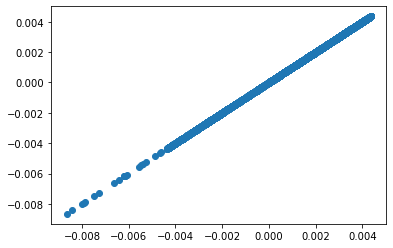

In [1495]:
plt.scatter(df11.total_angle.values-df22.total_angle.values, df11.total_angle.values-df22.total_angle.values)

In [1499]:
0.004*12/np.pi*60

0.9167324722093172

Text(0.5, 0.92, 'Each data sample time value error')

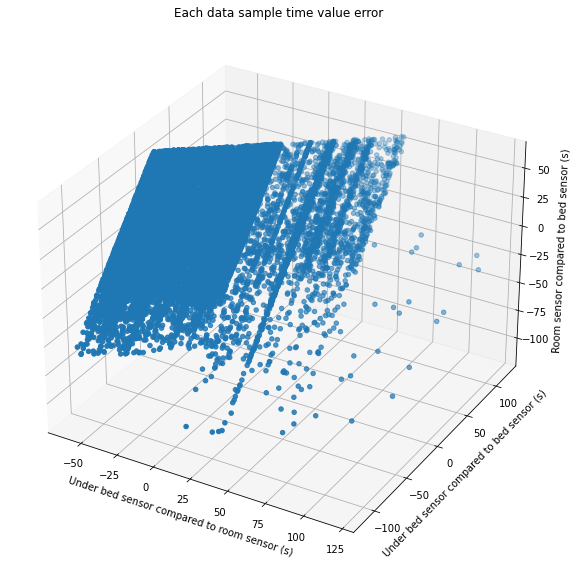

In [1537]:
def get_error(a, b): return (b.total_angle.values-a.total_angle.values)*12/np.pi*3600
# error between date values
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(projection='3d')
ax.scatter(get_error(df11, df22), get_error(df11, dfpp), get_error(df22, dfpp))
ax.set_xlabel('Under bed sensor compared to room sensor (s)')
ax.set_ylabel('Under bed sensor compared to bed sensor (s)')
ax.set_zlabel('Room sensor compared to bed sensor (s)')
ax.set_title('Each data sample time value error')

In [1473]:
df11.total_angle.values - df22.total_angle.values

array([ 0.00295818,  0.00295818,  0.00295818, ...,  0.01448482,
       -0.01172193, -0.00735421])

In [1470]:
df22.angle.values - df11.angle.values

array([-0.0004226 , -0.0004226 , -0.0004226 , ..., -0.00206926,
        0.00167456,  0.0010506 ])

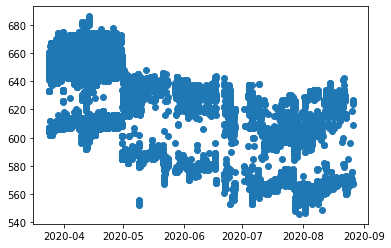

In [1500]:
plt.scatter(df11.date, dfpp.value)

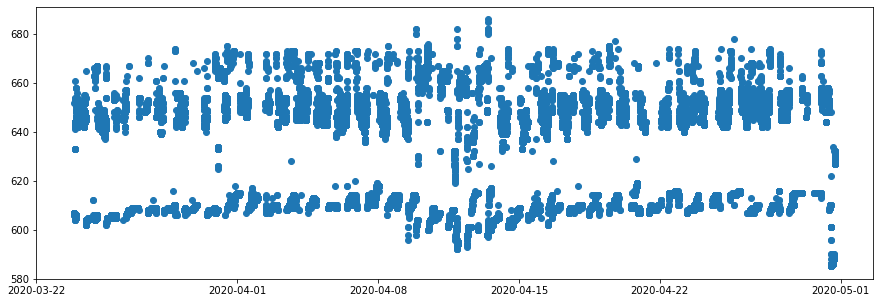

In [1501]:
figure = plt.figure(figsize = (15, 5))
plt.scatter(df11.date[:45000], dfpp.value[:45000])

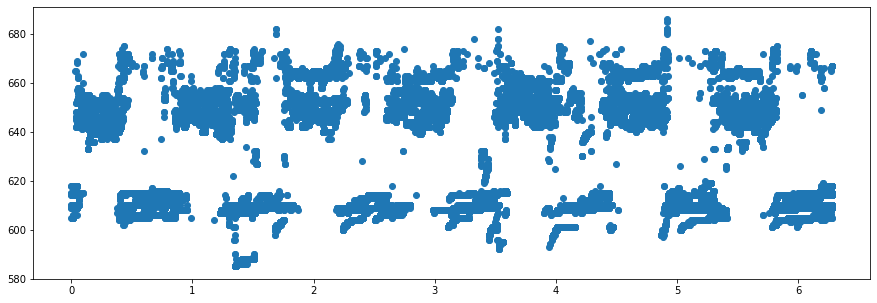

In [1502]:
figure = plt.figure(figsize = (15, 5))
plt.scatter(df11.angle[:45000], dfpp.value[:45000])

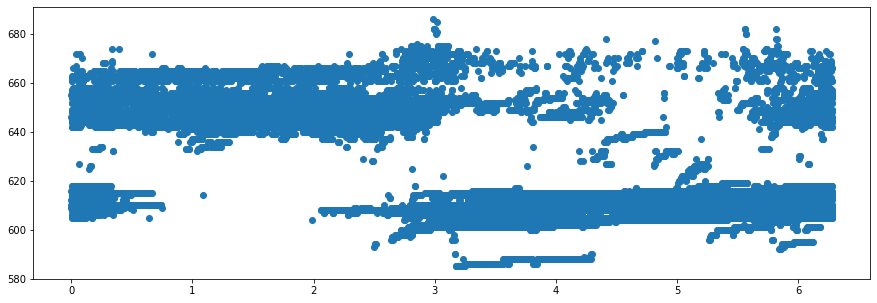

In [1503]:
figure = plt.figure(figsize = (15, 5))
plt.scatter(df11.d_angle[:45000], dfpp.value[:45000])

In [1504]:
def del_non_linear1(X, bp = 50, s = 5):
    W = [i for i in range(0, len(X), bp) if np.std(X[i:i+bp]) > s]
    Y = np.zeros((len(W)*bp))
    for i in W:
        j = W.index(i)*bp
        try: Y[j:j+bp] = X[i:i+bp]
        except: next
    return Y

In [1840]:
def del_non_linear(X, bp = 50, s0 = 1.5, s2 = 4):
    W = [i for i in range(0, len(X), bp) if np.std(X[i:i+bp,1]) > s0 and np.std(X[i:i+bp,1]) < s2]
    if len(W) < 2: return None
    Y = np.zeros(((len(W)-1)*bp,2), dtype = 'O')
    for i in W[:-1]:
        j = W.index(i)*bp
        Y[j:j+bp,:] = X[i:i+bp,:]
    return Y

In [1841]:
v = del_non_linear(dfpp[['angle', 'value']].values, bp = 200)

In [1842]:
len(dfpp), len(v), max(dfp.value), min(dfp.value)

(64363, 11400, 687, 541)

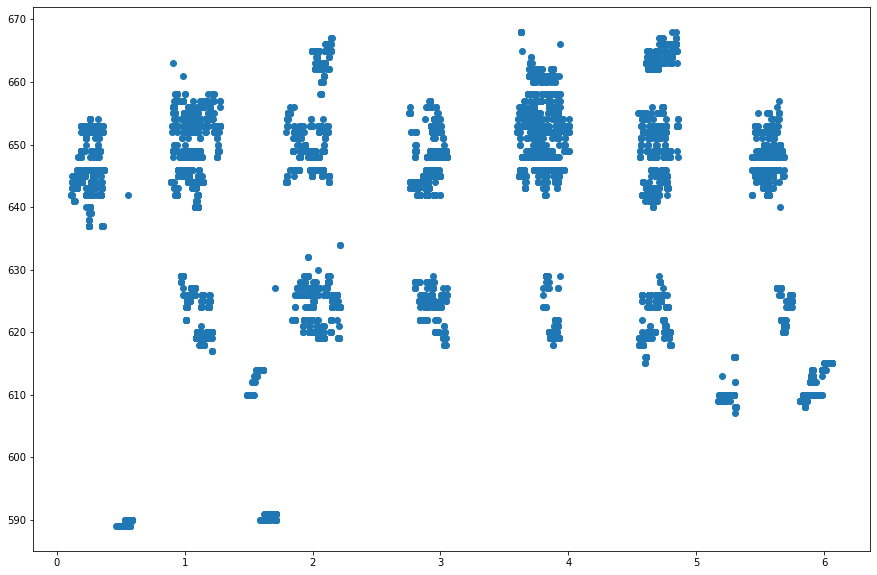

In [1843]:
figure = plt.figure(figsize = (15,10))
plt.scatter(v[:,0], v[:,1])

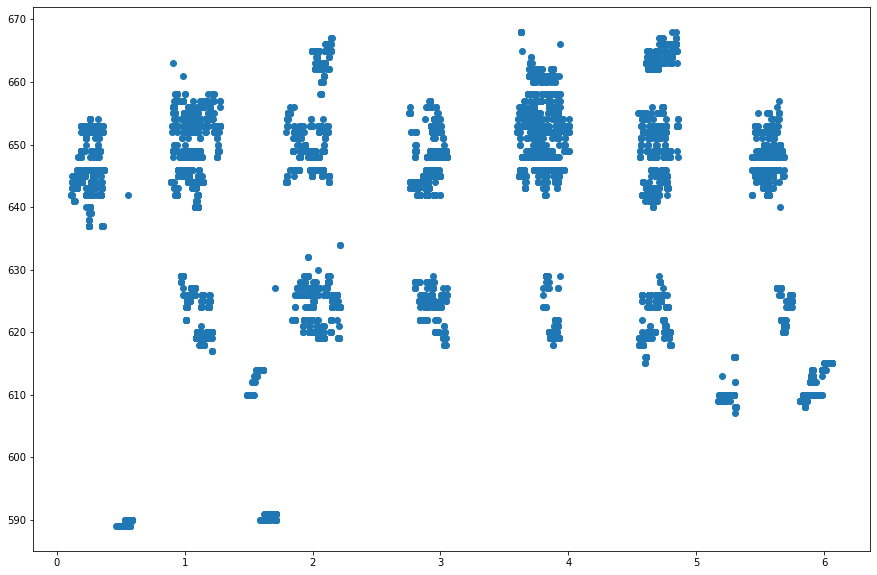

In [1844]:
figure = plt.figure(figsize = (15,10))
plt.scatter(v[:,0], v[:,1])

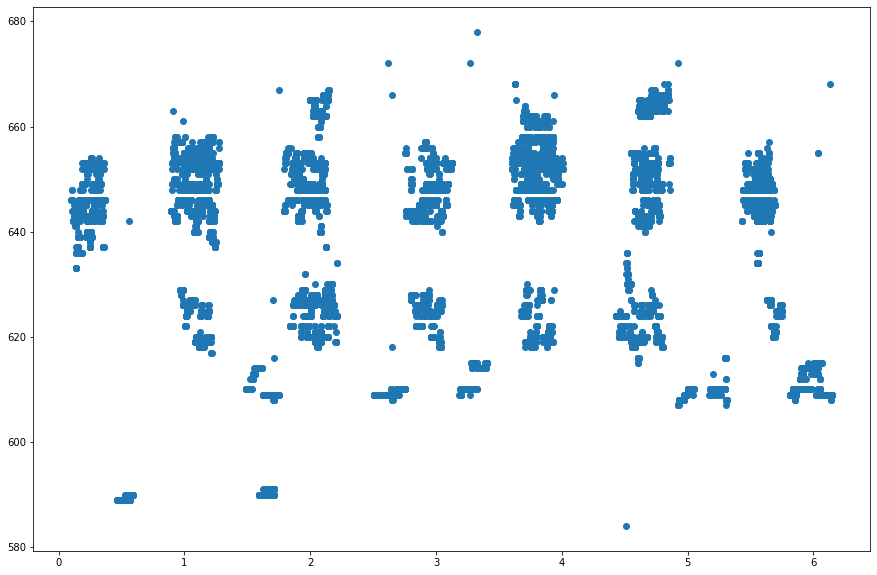

In [1798]:
figure = plt.figure(figsize = (15,10))
plt.scatter(v[:,0], v[:,1])

In [2037]:
def plot_cartesian(x, y, c = 'green', ini=0, too = -1, figsize=(), xlab = '', ylab = '', centers=[]):
    if xlab == '': xlab = 'Weekday and time'
    if ylab == '': ylab = 'Value of bed pressure sensor'
    if too == -1: too = len(x)
    dif = ini+too
    if isinstance(c, list): c = c[ini:dif]
    if len(figsize) == 0: fig, ax = plt.subplots()
    else: fig, ax = plt.subplots(figsize = figsize)
    period = 6
    ax.set_xticks(np.linspace(0, 2*np.pi, 24//period*7, endpoint=False))
    hh = pd.date_range(start,start+np.timedelta64(1, 'W') ,freq = str(period)+'h' ).strftime("%H").tolist()[:-1]
    for i in range(0, len(hh), (24//period)): hh[i] =  weekdays[int(i//(24/period))]
    ax.set_xticklabels(hh)
    ax.set_xlabel(xlab, fontweight ="bold")
    ax.set_ylabel(ylab, fontweight ="bold")
    ax.scatter(x[ini:dif], y[ini:dif], c=c, alpha = 0.5)
    if len(centers) != 0:
        ax.scatter(centers[:,0], centers[:,1], marker = 'x', c='red', label = 'Cluster centre')
        ax.legend()
        for i in range(len(centers)):
            tx = f"({round((centers[i,0]*7/2/np.pi*24)%24, 2)}, {centers[i,1]})"
            ax.annotate(tx, (centers[i,0], centers[i,1]), color = 'red', alpha = 0.9)

In [1939]:
kcen

array([[1.2200e+00, 6.0300e+02],
       [4.6900e+00, 6.4595e+02],
       [2.9200e+00, 6.3993e+02],
       [2.6000e-01, 6.4673e+02],
       [3.8000e+00, 6.4922e+02],
       [5.7000e+00, 6.1437e+02],
       [2.0000e+00, 6.3877e+02],
       [5.5600e+00, 6.4898e+02],
       [1.0600e+00, 6.4732e+02]])

In [2031]:
mms = MinMaxScaler().fit(v)
X = mms.transform(v)
X[:,0] = X[:,0]*4

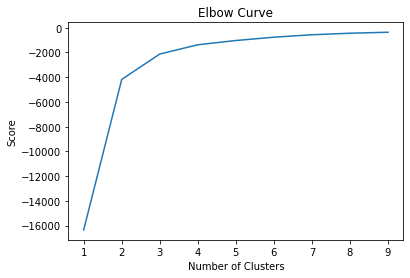

In [2032]:
Nc = range(1, 10)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
score
plt.plot(Nc,score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

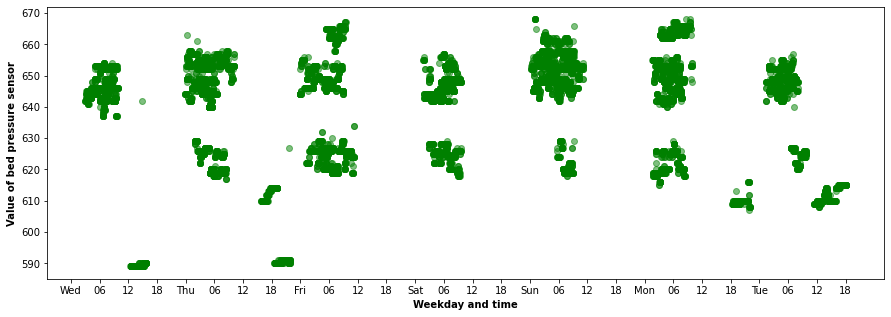

In [2035]:
plot_cartesian(v[:,0], v[:,1], figsize = (15,5))

<Figure size 1080x360 with 0 Axes>

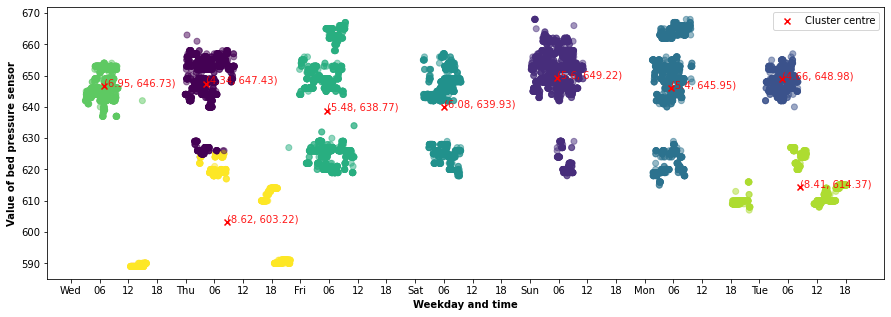

In [2039]:
figure = plt.figure(figsize=(15,5))
km = KMeans(n_clusters=9).fit(X)
kcen = km.cluster_centers_
kcen[:,0] = kcen[:,0]/4
kcen = np.around(mms.inverse_transform(kcen), decimals=2)
plot_cartesian(v[:,0], v[:,1], figsize = (15,5), c = km.labels_, centers =kcen)

In [2018]:
def get_centers(xx, labels):
    return [tuple(np.around(list(np.mean(xx[labels == i], axis = 0)), decimals=3)) for i in np.unique(labels)]

<Figure size 1080x360 with 0 Axes>

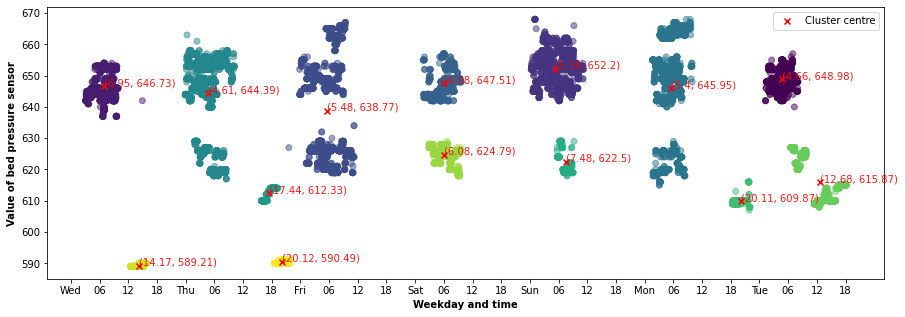

In [2040]:
figure = plt.figure(figsize=(15,5))
db = DBSCAN(eps = .164, min_samples = 100).fit(X)
dcen = np.around(get_centers(v, db.labels_), decimals=2)
plot_cartesian(v[:,0], v[:,1], c = db.labels_, figsize = (15,5), centers = dcen)

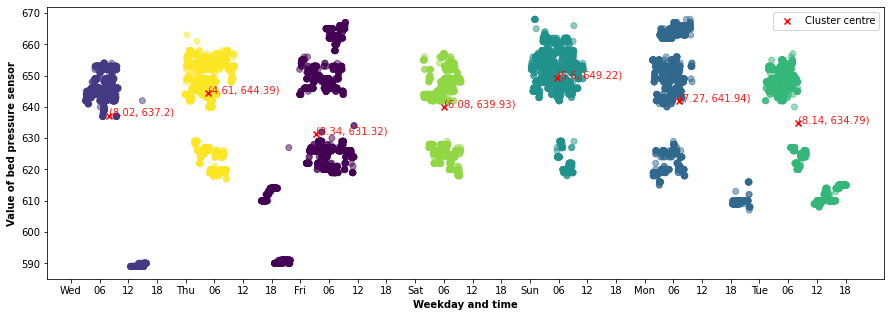

In [2041]:
from sklearn.cluster import AgglomerativeClustering
ag =AgglomerativeClustering(n_clusters = 7).fit(X)
acen = np.around(get_centers(v, ag.labels_), decimals = 2)
plot_cartesian(v[:,0], v[:,1], c = ag.labels_, figsize=(15,5), centers = acen)

In [1895]:
get_centers(v.copy(), np.unique(ag.labels_))

[(1.92, 631.324),
 (0.301, 637.195),
 (4.755, 641.941),
 (3.796, 649.218),
 (5.69, 634.789),
 (2.922, 639.934),
 (1.066, 644.388)]

In [1872]:
l0 = ['agglomerative', 'dbscan', 'kmeans']
l1 = [ag, db, km]
n = v.shape[0]
value_models = dict()
for meth in l0:
    lab = l1[l0.index(meth)].labels_
    dic = dict()
    for i in range(n):
        pp = [v[i,0]*7/np.pi/2*24]
        if lab[i] in dic: dic[lab[i]].extend(pp)
        else: dic[lab[i]] = pp
    value_models[meth] = dic

In [1873]:
sleeping_time = {key: {ke: [np.min(list(va)), np.median(list(va)), np.max(list(va))]for ke, va in value.items()} for key, value in value_models.items()}   

In [1874]:
sleeping_time

{'agglomerative': {4: [145.26129954766458,
   150.79312416892228,
   162.1509169222304],
  1: [3.0300370155374017, 7.49236318483327, 15.794384811165386],
  3: [96.27807888466756, 101.46439916409912, 107.17305379384561],
  0: [39.84217603633601, 52.51112336728077, 59.22301481137376],
  5: [73.7007353132926, 78.31032996553242, 81.57076078784529],
  2: [121.61186068058976, 125.91517671141652, 142.01312451283826],
  6: [23.906948755074033, 28.388568416826185, 34.18932179107433]},
 'dbscan': {0: [145.26129954766458, 148.80045276582803, 152.0266293776148],
  1: [3.0300370155374017, 6.9690587576368745, 14.94705724654967],
  2: [96.27807888466756, 101.05083430918373, 107.17305379384561],
  3: [45.575392351138035, 53.55282236133319, 59.22301481137376],
  4: [73.7007353132926, 78.36001411948769, 81.57076078784529],
  5: [121.61186068058976, 125.57305974963589, 129.91162556235707],
  6: [23.906948755074033, 28.388568416826185, 34.18932179107433],
  7: [39.84217603633601, 41.52999985232785, 43.192

In [1877]:
week_sleep_tieme = {key: {ve[0]//24:np.remainder(ve, 24) for ke, ve in value.items() if ke < 8} for key, value in sleeping_time.items()} 

In [1878]:
week_sleep_tieme

{'agglomerative': {6.0: array([ 1.26129955,  6.79312417, 18.15091692]),
  0.0: array([23.90694876,  4.38856842, 10.18932179]),
  4.0: array([ 0.27807888,  5.46439916, 11.17305379]),
  1.0: array([15.84217604,  4.51112337, 11.22301481]),
  3.0: array([1.70073531, 6.31032997, 9.57076079]),
  5.0: array([ 1.61186068,  5.91517671, 22.01312451])},
 'dbscan': {6.0: array([1.26129955, 4.80045277, 8.02662938]),
  0.0: array([23.90694876,  4.38856842, 10.18932179]),
  4.0: array([ 0.27807888,  5.05083431, 11.17305379]),
  1.0: array([15.84217604, 17.52999985, 19.19266558]),
  3.0: array([1.70073531, 6.36001412, 9.57076079]),
  5.0: array([1.61186068, 5.57305975, 9.91162556])},
 'kmeans': {6.0: array([1.26129955, 4.80045277, 8.02662938]),
  0.0: array([23.90694876,  4.12073704, 10.18932179]),
  4.0: array([ 0.27807888,  5.46439916, 11.17305379]),
  1.0: array([21.57539235,  5.55282236, 11.22301481]),
  3.0: array([1.70073531, 6.31032997, 9.57076079]),
  5.0: array([18.32741518, 10.6229485 , 18.1

In [13]:
sensor

,sensor_id,node_id,type,name,room
0,5894,541150,INT,corridor/ambience/motion,corridor
1,5895,541151,INT,bathroom/ambience/motion,bathroom
2,7125,542381,INT,bathroom/ambience/light,bathroom
3,5896,541152,INT,bedroom/bed/pressure,bedroom
4,6127,541383,INT,livingroom/tv/light,livingroom
5,6220,541444,INT,balcon/door/contact,balcon
6,6253,541509,INT,kitchen/fridge/contact,kitchen
7,6632,541888,FLOAT,kitchen/coffeemaker/current,kitchen
8,6633,541889,FLOAT,kitchen/sandwichmaker/current,kitchen
9,6634,541890,FLOAT,kitchen/dishwasher/current,kitchen


In [19]:
st = 10000
mm = st + 10000
tf = 5
id0, id1 = 5896, 5889
df0 = sen_int[sen_int.sensor_id == id0].iloc[st:mm:tf]
df1 = sen_int[sen_int.sensor_id == id1].iloc[st:mm:tf]
df2 = sen_int[sen_int.sensor_id.isin([id0, id1])].iloc[st*2:mm*2:tf]

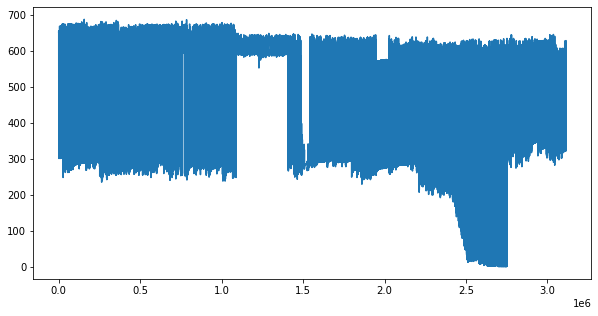

In [103]:
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(sen_int[sen_int.sensor_id.isin([id0, id1])]['value'])

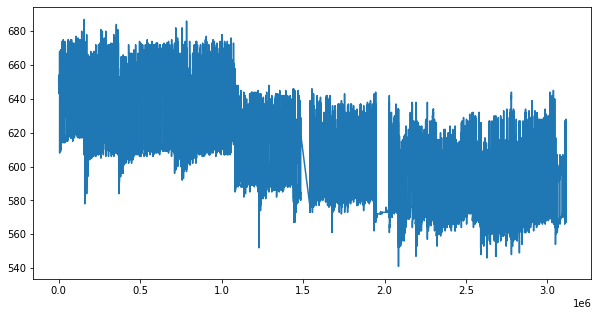

In [104]:
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(sen_int[sen_int.sensor_id == id0]['value'])

In [111]:
df11 = sen_int[sen_int.sensor_id == id1]


In [110]:
len(df11)

188383

In [112]:
len(df11)

178738

In [115]:
188383/60/24/30

4.360717592592593

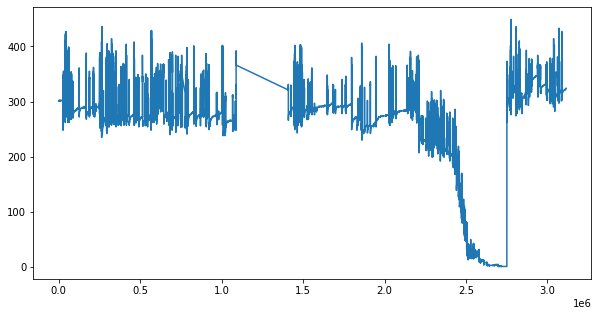

In [105]:
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(sen_int[sen_int.sensor_id == id1]['value'])

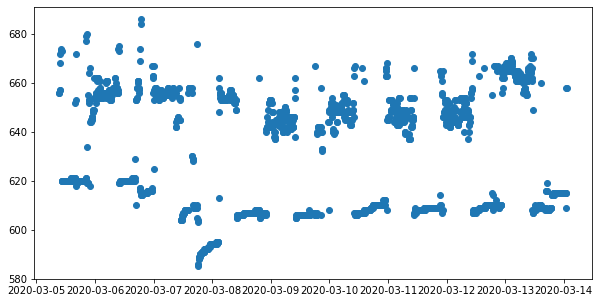

In [83]:
fig, ax = plt.subplots(figsize=(10, 5))
ax.scatter(df0.date, df0.value)

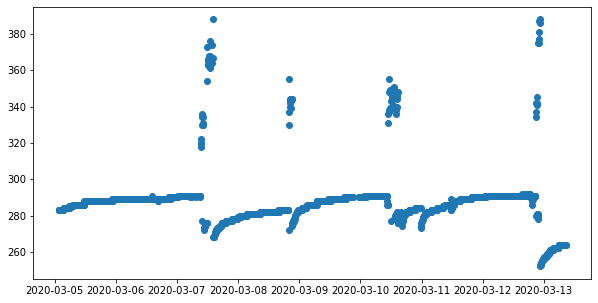

In [84]:
fig, ax = plt.subplots(figsize=(10, 5))
plt.scatter(df1.date, df1.value)

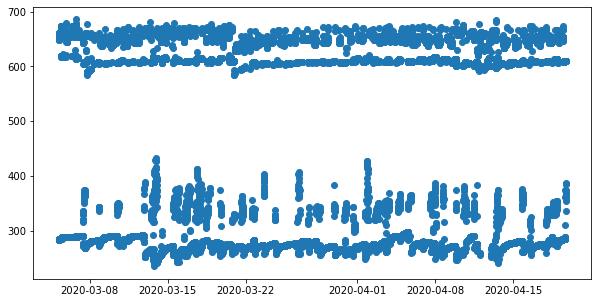

In [78]:
fig, ax = plt.subplots(figsize=(10, 5))
plt.scatter(df2.date, df2.value)

In [74]:
sen_int[sen_int.sensor_id == 5889]

,value_id,sensor_id,timestamp,value,date,angle,radius,color,d_angle,d_radius,total_angle
6,18730550,5889,2020-02-26 00:00:00.589294,301,2020-02-26 00:00:00.589294,0.000005,1.0,3,0.000036,1.0,0.000036
18,18731819,5889,2020-02-26 00:01:10.137501,301,2020-02-26 00:01:10.137501,0.000728,1.0,3,0.005094,1.0,0.005094
28,18733127,5889,2020-02-26 00:02:20.723419,301,2020-02-26 00:02:20.723419,0.001461,1.0,3,0.010227,1.0,0.010227
38,18734579,5889,2020-02-26 00:03:39.961887,301,2020-02-26 00:03:39.961887,0.002284,1.0,3,0.015990,1.0,0.015990
48,18735966,5889,2020-02-26 00:04:55.894362,301,2020-02-26 00:04:55.894362,0.003073,1.0,3,0.021512,1.0,0.021512
...,...,...,...,...,...,...,...,...,...,...,...
3113664,253816332,5889,2020-08-26 10:23:04.811564,324,2020-08-26 10:23:04.811564,0.388656,27.0,3,2.720589,183.0,1146.260315
3113676,253817120,5889,2020-08-26 10:24:12.986160,324,2020-08-26 10:24:12.986160,0.389364,27.0,3,2.725547,183.0,1146.265273
3113690,253817929,5889,2020-08-26 10:25:22.199677,324,2020-08-26 10:25:22.199677,0.390083,27.0,3,2.730580,183.0,1146.270306
3113704,253818700,5889,2020-08-26 10:26:29.179664,324,2020-08-26 10:26:29.179664,0.390779,27.0,3,2.735451,183.0,1146.275177


In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import matrixprofile as mp


In [20]:
ts = sen_int[sen_int.sensor_id == id0]['value'].values[:131072]

len(ts)

131072

In [30]:
profile = matrixProfile.scrimp_plus_plus(ts, 60)

C:\Users\FHassan\Desktop\WPy64-3860\python-3.8.6.amd64\lib\site-packages\matrixprofile\scrimp.py:67: RuntimeWarning: divide by zero encountered in true_divide
  dist = (z[m - 1:n] - m * meanx * meany) / (sigmax * sigmay)
C:\Users\FHassan\Desktop\WPy64-3860\python-3.8.6.amd64\lib\site-packages\matrixprofile\scrimp.py:67: RuntimeWarning: invalid value encountered in true_divide
  dist = (z[m - 1:n] - m * meanx * meany) / (sigmax * sigmay)
C:\Users\FHassan\Desktop\WPy64-3860\python-3.8.6.amd64\lib\site-packages\matrixprofile\scrimp.py:69: RuntimeWarning: invalid value encountered in multiply
  dist = np.real(2 * dist)
C:\Users\FHassan\Desktop\WPy64-3860\python-3.8.6.amd64\lib\site-packages\matrixprofile\scrimp.py:256: RuntimeWarning: divide by zero encountered in true_divide
  tmp_g = (m-(tmp_a - m * tmp_f) / (tmp_d * tmp_e))
C:\Users\FHassan\Desktop\WPy64-3860\python-3.8.6.amd64\lib\site-packages\matrixprofile\scrimp.py:256: RuntimeWarning: invalid value encountered in true_divide
  tmp_

In [33]:
cac = fluss.fluss(profile[1], 60)

C:\Users\FHassan\Desktop\WPy64-3860\python-3.8.6.amd64\lib\site-packages\matrixprofile\fluss.py:58: RuntimeWarning: invalid value encountered in true_divide
  idealized = cross_count / idealized


Text(0.5, 0, 'Sample')

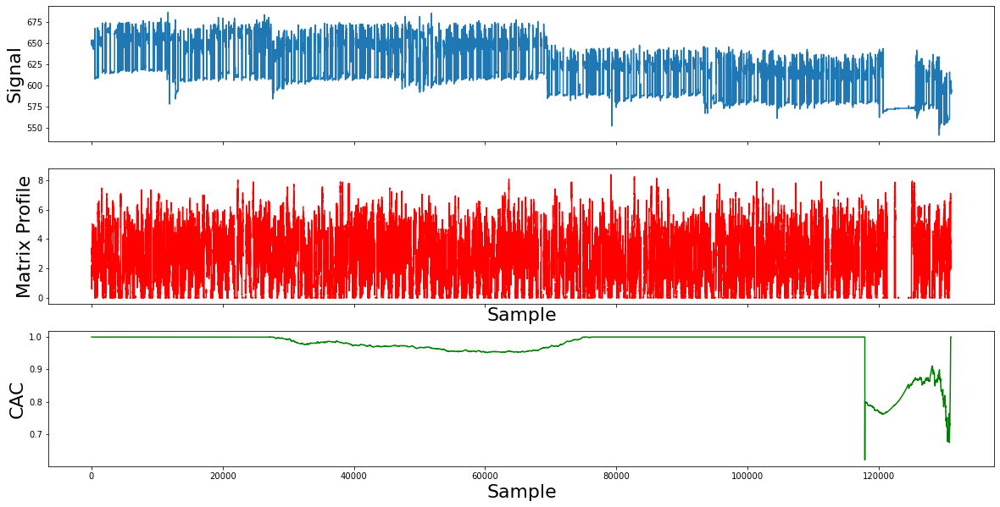

In [37]:
#Append np.nan to Matrix profile to enable plotting against raw data
m = 60
pattern = ts
mp_adj = np.append(profile[0],np.zeros(m-1)+np.nan)

#Plot the signal data
fig, (ax1, ax2, ax3) = plt.subplots(3,1,sharex=True,figsize=(20,10))
ax1.plot(np.arange(len(pattern)),pattern, label="Synthetic Data")
ax1.set_ylabel('Signal', size=22)

#Plot the Matrix Profile
ax2.plot(np.arange(len(mp_adj)),mp_adj, label="Matrix Profile", color='red')
ax2.set_ylabel('Matrix Profile', size=22)
ax2.set_xlabel('Sample', size=22)

#Plot the CAC
ax3.plot(np.arange(len(cac)),cac, label="CAC", color='green')
ax3.set_ylabel('CAC', size=22)
ax3.set_xlabel('Sample', size=22)

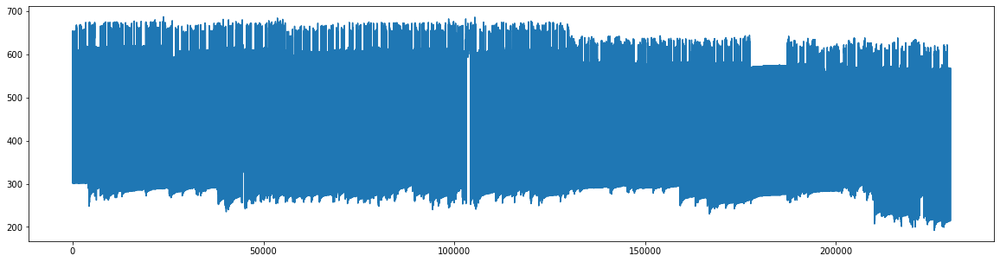

In [364]:
m = 90*24*7*2
dts = sen_int[sen_int.sensor_id.isin([id0, id1])][:280000]
dts = dts[~dts.index.isin(dts.iloc[130000:180000].index)]
ts = dts['value'].tolist()
prof = mp.compute(ts, windows=m)
fig, ax = plt.subplots(figsize = (20,5))
ax.plot(ts)

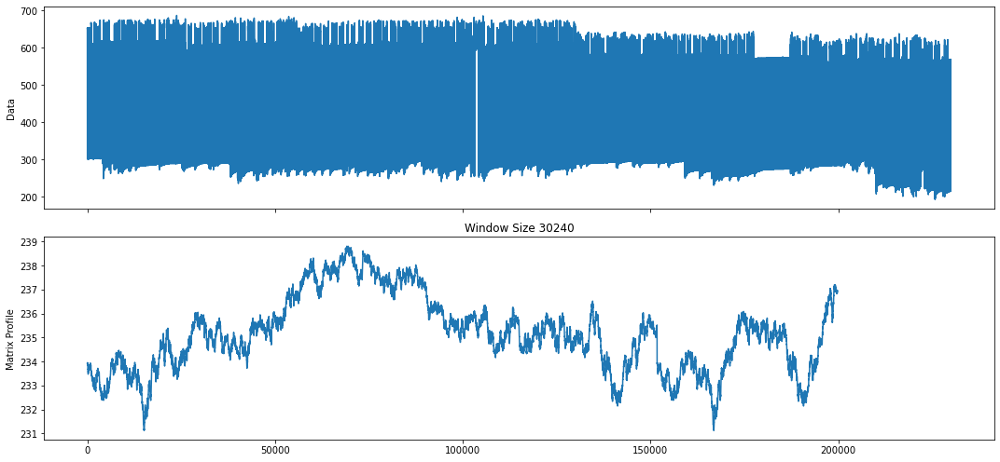

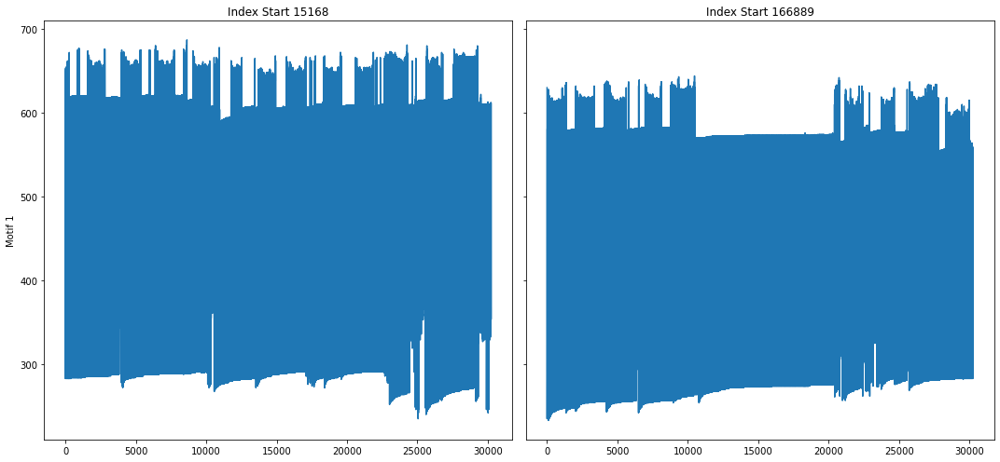

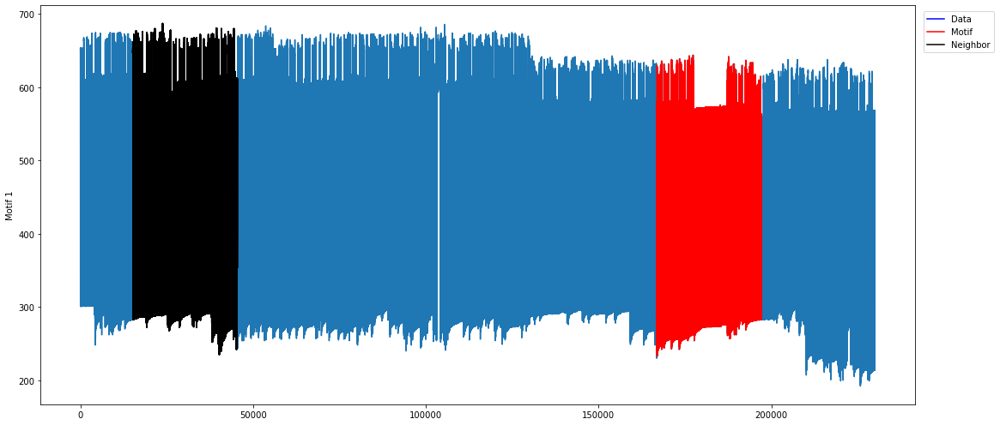

In [365]:
mprofile = mp.discover.motifs(prof, k=1)
figures = mp.visualize(mprofile)

In [366]:
mprofile

{'mp': array([233.91674025, 233.90856798, 233.90193816, ..., 236.95829095,
        236.9536623 , 236.95073949]),
 'pi': array([151757, 151758, 151759, ..., 190089, 190090, 190091]),
 'rmp': None,
 'rpi': None,
 'lmp': None,
 'lpi': None,
 'metric': 'euclidean',
 'w': 30240,
 'ez': 0,
 'join': False,
 'sample_pct': 1,
 'data': {'ts': array([652., 301., 301., ..., 568., 214., 568.]),
  'query': None},
 'class': 'MatrixProfile',
 'algorithm': 'mpx',
 'motifs': [{'motifs': [15168, 166889],
   'neighbors': [15168,
    15168,
    15168,
    15168,
    15168,
    15168,
    15168,
    15168,
    15168,
    15168]}]}

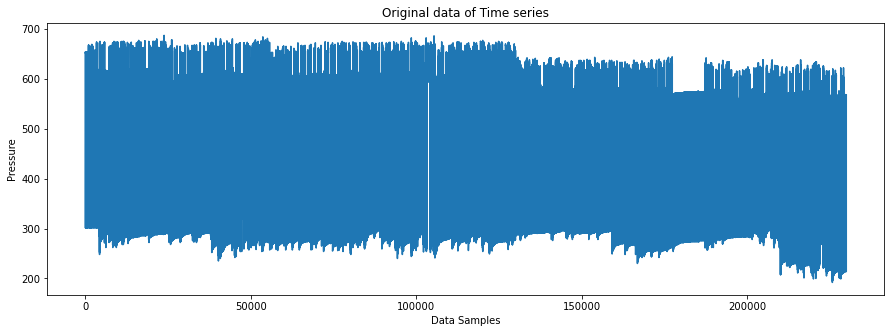

In [381]:
def plot_ts(y, title = ''):
    fig, ax = plt.subplots(figsize=(15,5))
    ax.plot(y)
    ax.set_xlabel('Data Samples')
    ax.set_ylabel('Pressure')
    ax.set_title(title)
plot_ts(ts, 'Original data of Time series')

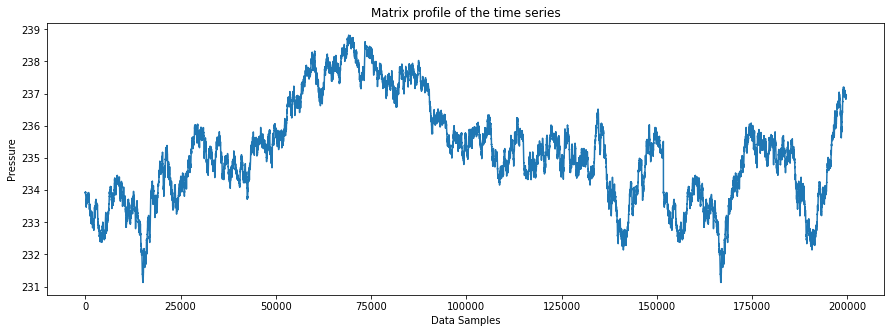

In [379]:
plot_ts(mprofile['mp'], 'Matrix profile of the time series')

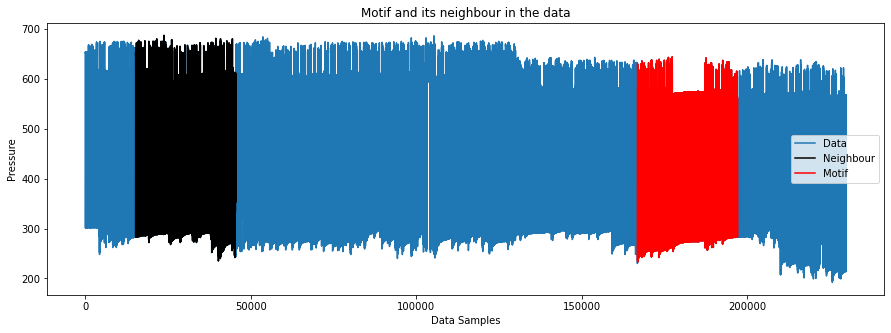

In [398]:
fig, ax = plt.subplots(figsize=(15,5))
x = [i for i in range(len(ts))]
ax.plot(x, ts, label = 'Data')
nei_i = mprofile['motifs'][0]['motifs'][0]
mot_i = mprofile['motifs'][0]['motifs'][1]
ax.plot(x[nei_i: nei_i+m], ts[nei_i:nei_i+m], label = 'Neighbour', c='black')
ax.plot(x[mot_i: mot_i+m], ts[mot_i:mot_i+m], label = 'Motif', c = 'red')
ax.set_xlabel('Data Samples')
ax.set_ylabel('Pressure')
ax.set_title('Motif and its neighbour in the data')
ax.legend()

Text(0, 0.5, 'Pressure sensor value')

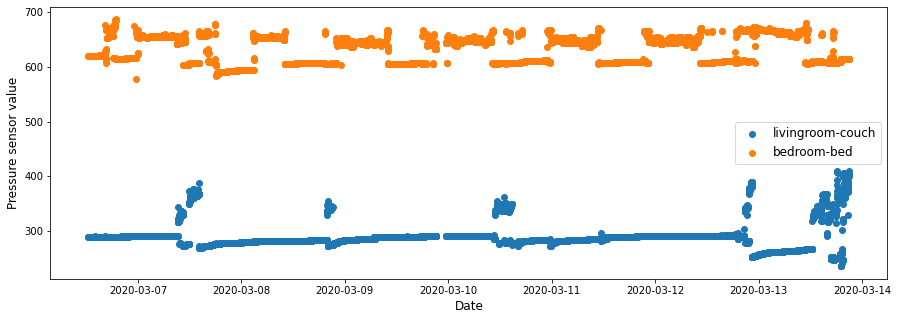

In [407]:
idd = mprofile['motifs'][0]['motifs'][0]
ddf = sen_int[sen_int.sensor_id.isin([id0, id1])][idd+8000:idd+m-5000]
fig, ax = plt.subplots(figsize = (15, 5))
for x in ddf.sensor_id.unique():
    ddfx = ddf[ddf.sensor_id == x]
    ax.scatter(ddfx.date, ddfx.value, label = id_room[x])
ax.legend(fontsize = 12)
ax.set_xlabel('Date', fontsize = 12)
ax.set_ylabel('Pressure sensor value', fontsize = 12)

Starting point Tue 03-Mar-2020 03:12


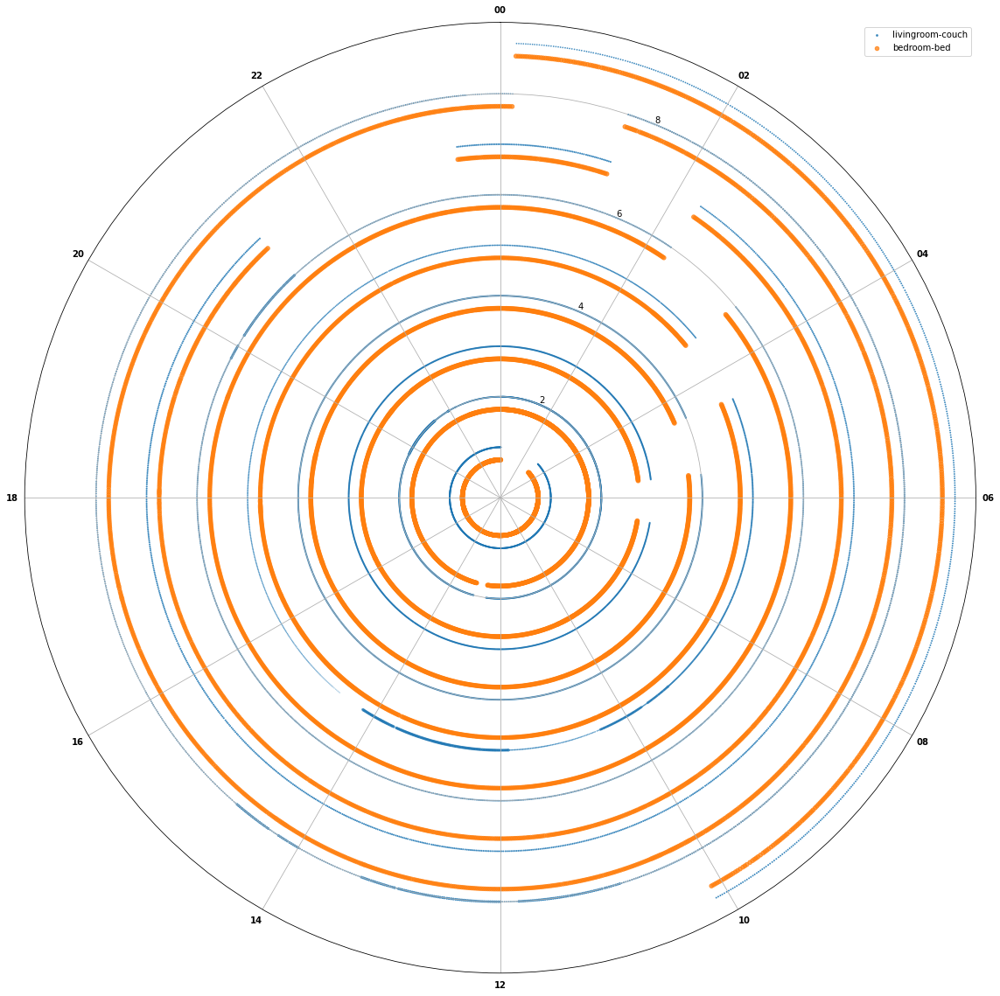

In [225]:
idd = mprofile['motifs'][0]['motifs'][0]
ddf = sen_int[sen_int.sensor_id.isin([id0, id1])][idd+200:idd+m]
ddf['d_radius'] = ddf['d_radius'] - ddf.iloc[0]['d_radius'] + 1
ddf['value'] = (ddf['value'] - min(ddf['value']))/18
plot_polar_day(ddf)

In [172]:
ddf

,value_id,sensor_id,timestamp,value,date,angle,radius,color,d_angle,d_radius,total_angle
1694590,168671649,5889,2020-06-04 08:42:49.857787,2.388889,2020-06-04 08:42:49.857787,1.223642,15.0,3,2.282306,1.0,624.317652
1694605,168672614,5889,2020-06-04 08:44:01.438441,2.388889,2020-06-04 08:44:01.438441,1.224385,15.0,3,2.287512,1.0,624.322857
1694623,168673665,5889,2020-06-04 08:45:20.299913,2.388889,2020-06-04 08:45:20.299913,1.225205,15.0,3,2.293247,1.0,624.328592
1694640,168674584,5889,2020-06-04 08:46:28.577528,2.388889,2020-06-04 08:46:28.577528,1.225914,15.0,3,2.298212,1.0,624.333558
1694656,168675515,5889,2020-06-04 08:47:37.037038,2.388889,2020-06-04 08:47:37.037038,1.226625,15.0,3,2.303191,1.0,624.338536
...,...,...,...,...,...,...,...,...,...,...,...
1854408,178260744,5889,2020-06-12 15:52:56.330882,1.555556,2020-06-12 15:52:56.330882,2.389352,16.0,3,4.159092,9.0,676.459920
1854425,178261658,5889,2020-06-12 15:54:03.628403,1.444444,2020-06-12 15:54:03.628403,2.390051,16.0,3,4.163986,9.0,676.464814
1854439,178262571,5889,2020-06-12 15:55:10.751408,1.555556,2020-06-12 15:55:10.751408,2.390748,16.0,3,4.168868,9.0,676.469695
1854455,178263510,5889,2020-06-12 15:56:20.127295,1.444444,2020-06-12 15:56:20.127295,2.391469,16.0,3,4.173913,9.0,676.474741


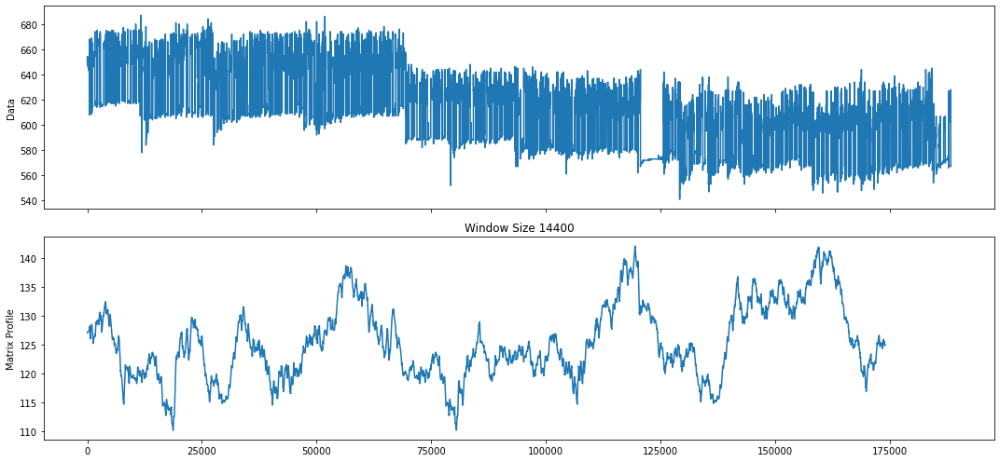

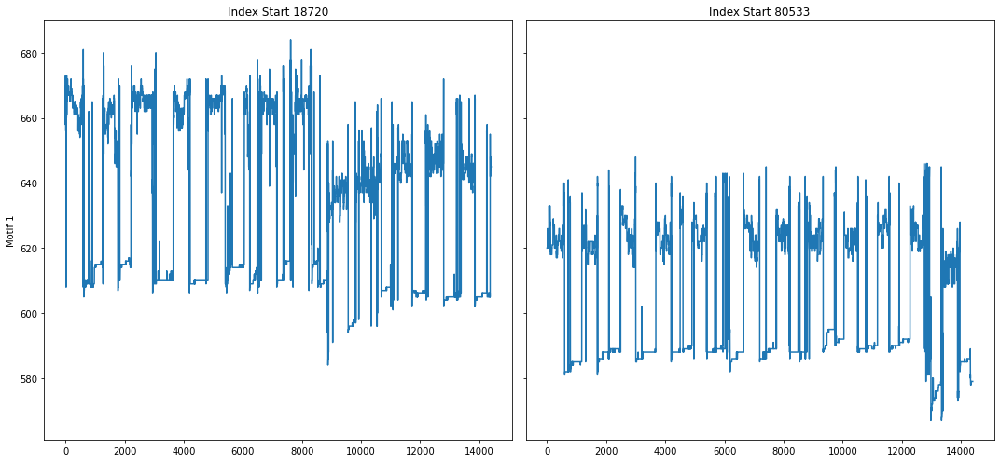

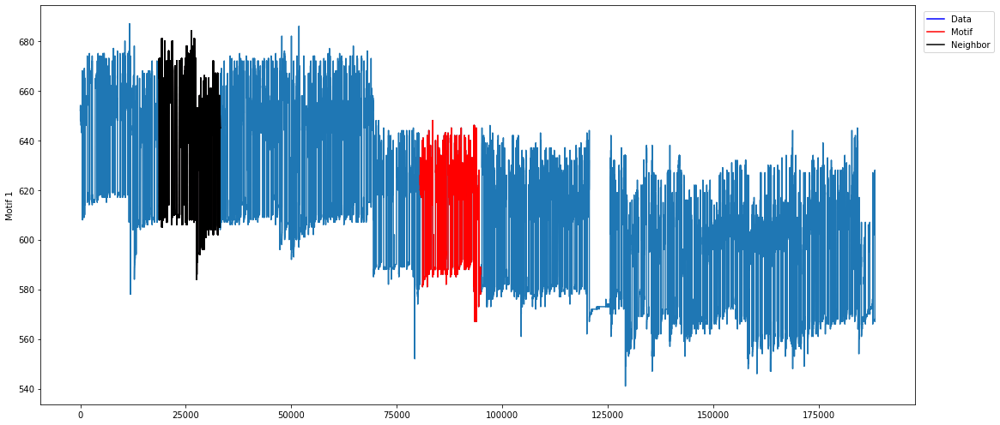

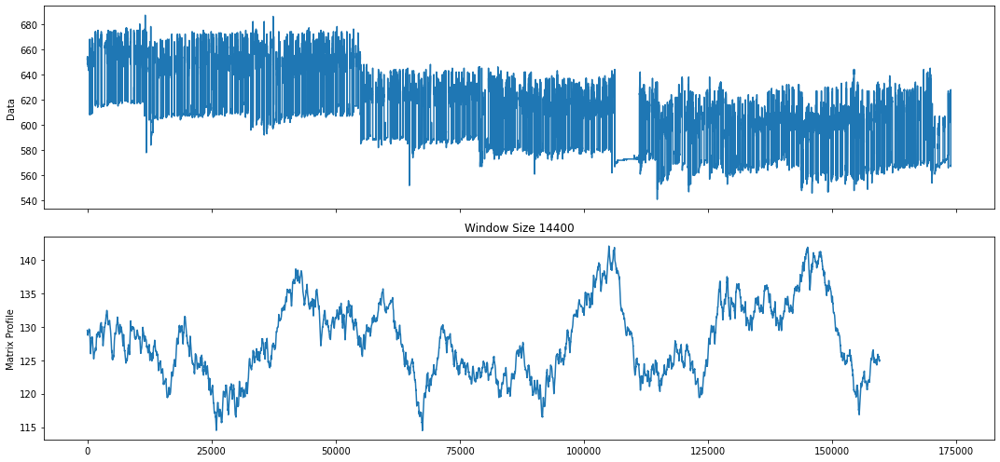

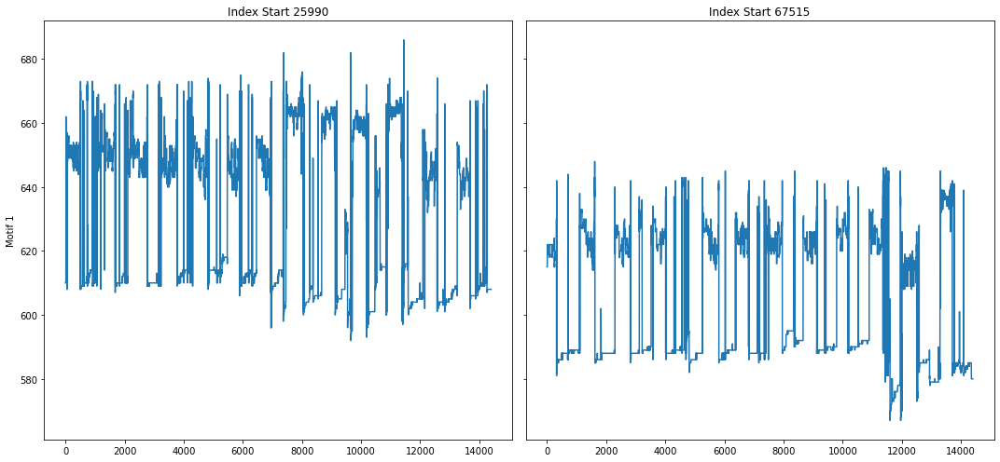

...

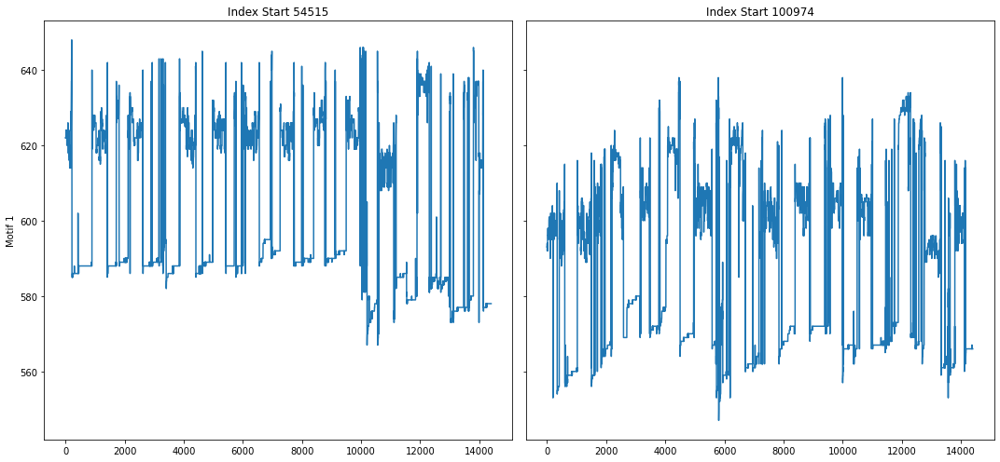

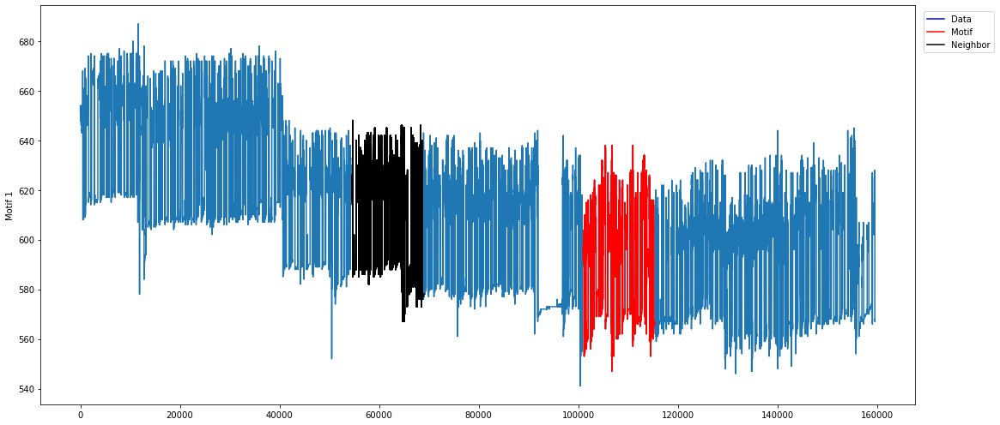

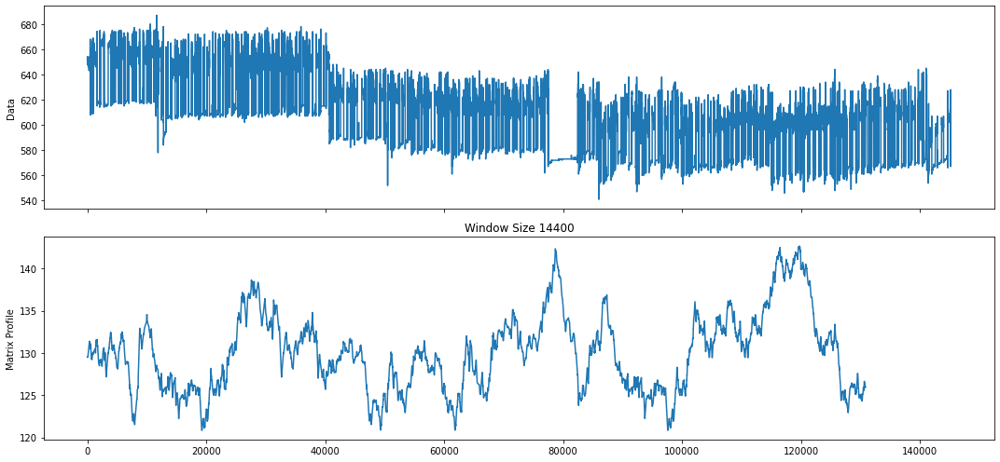

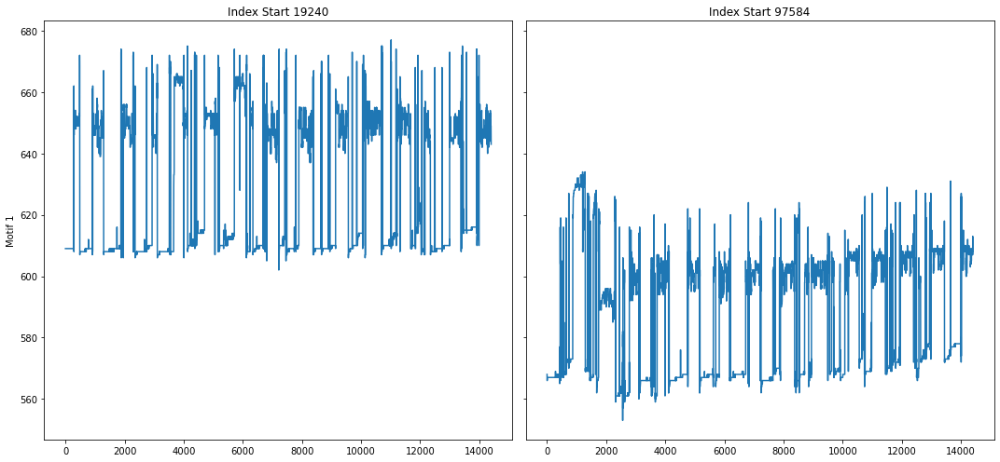

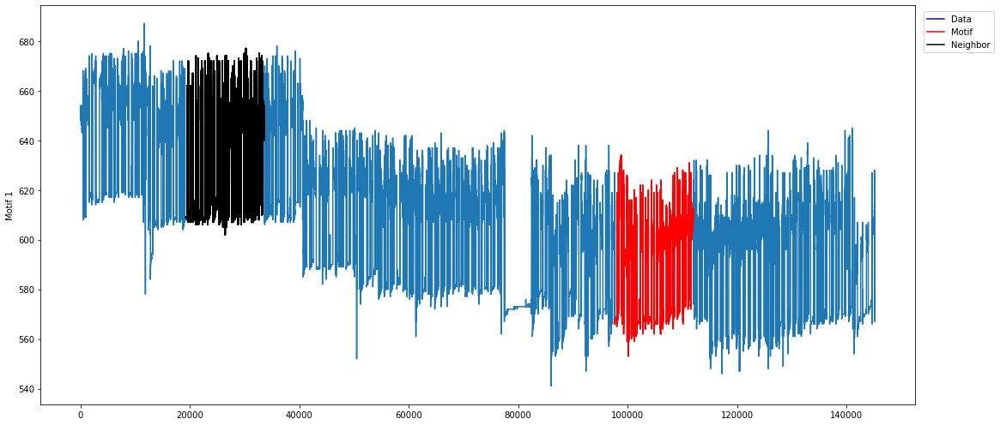

In [77]:
tsi = sen_int[sen_int.sensor_id == id0]['value'].tolist()
l_mprofile = []
for i in range(4):
    prof_i = mp.compute(tsi, windows=m)
    mprofile_i = mp.discover.motifs(prof_i, k=1)
    figures_i = mp.visualize(mprofile_i)
    l_mprofile.append(mprofile_i)
    ne_i = mprofile_i['motifs'][0]['neighbors'][0]
    tsi = tsi[:ne_i] + tsi[ne_i+m:]